#  Prediction of Building's EUI

### Importing of Libraries

In [771]:
# Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import numpy as np
import time
import pandas as pd
import warnings

from sklearn.linear_model import Ridge, Lasso, LinearRegression, RidgeCV, LassoCV
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, train_test_split, cross_val_predict, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics

## Introduction

In this project, we aim to create a model to predict a building's EUI using its buidling characteristics as well as the weather data for the location of the building

## Dataset

The two datasets that we are using will be taken from the Kaggle Competition: WiDS Datathon 2022:

(1) the Training dataset where the observed values of the site EUI for each row is provided

(2) the Test dataset where the observed values of the site EUI for each row is withheld.

Do note that the buildings are located in the United States, however, which states that they reside in are anonymized. After determining the final predictive model to be used, we will use it to predict the site's EUI on the Test dataset and attain a submission score on Kaggle.

|Feature|Type|Dataset|Description|
|---|---|---|---|
|Year_Factor|int|train & test|anonymized year in which the weather and energy usage factors were observed| 
|State_Factor|int|train & test|anonymized state in which the building is located| 
|building_class|object|train & test|building classification| 
|facility_type|object|train & test|building usage type|
|floor_area|float|train & test|floor area (in square feet) of the building|
|year_built|int|train & test|year in which the building was constructed|
|energy_star_rating|int|train & test|the energy star rating of the building|
|ELEVATION|int|train & test|elevation of the building location|
|january_min_temp|float|train & test|minimum temperature in January (in Fahrenheit) at the location of the building|
|january_avg_temp|float|train & test|average temperature in January (in Fahrenheit) at the location of the building|
|january_max_temp|float|train & test|maximum temperature in January (in Fahrenheit) at the location of the building|
|february_min_temp|float|train & test|minimum temperature in February (in Fahrenheit) at the location of the building|
|february_avg_temp|float|train & test|average temperature in February (in Fahrenheit) at the location of the building|
|february_max_temp|float|train & test|maximum temperature in February (in Fahrenheit) at the location of the building|
|march_min_temp|float|train & test|minimum temperature in March (in Fahrenheit) at the location of the building|
|march_avg_temp|float|train & test|average temperature in March (in Fahrenheit) at the location of the building|
|march_max_temp|float|train & test|maximum temperature in March (in Fahrenheit) at the location of the building|
|april_min_temp|float|train & test|minimum temperature in April (in Fahrenheit) at the location of the building|
|april_avg_temp|float|train & test|average temperature in April (in Fahrenheit) at the location of the building|
|april_max_temp|float|train & test|maximum temperature in April (in Fahrenheit) at the location of the building|
|may_min_temp|float|train & test|minimum temperature in May (in Fahrenheit) at the location of the building|
|may_avg_temp|float|train & test|average temperature in May (in Fahrenheit) at the location of the building|
|may_max_temp|float|train & test|maximum temperature in May (in Fahrenheit) at the location of the building|
|june_min_temp|float|train & test|minimum temperature in June (in Fahrenheit) at the location of the building|
|june_avg_temp|float|train & test|average temperature in June (in Fahrenheit) at the location of the building|
|june_max_temp|float|train & test|maximum temperature in June (in Fahrenheit) at the location of the building|
|july_min_temp|float|train & test|minimum temperature in July (in Fahrenheit) at the location of the building|
|july_avg_temp|float|train & test|average temperature in July (in Fahrenheit) at the location of the building|
|july_max_temp|float|train & test|maximum temperature in July (in Fahrenheit) at the location of the building|
|august_min_temp|float|train & test|minimum temperature in August (in Fahrenheit) at the location of the building|
|august_avg_temp|float|train & test|average temperature in August (in Fahrenheit) at the location of the building|
|august_max_temp|float|train & test|maximum temperature in August (in Fahrenheit) at the location of the building|
|september_min_temp|float|train & test|minimum temperature in September (in Fahrenheit) at the location of the building|
|september_avg_temp|float|train & test|average temperature in September (in Fahrenheit) at the location of the building|
|september_max_temp|float|train & test|maximum temperature in September (in Fahrenheit) at the location of the building|
|october_min_temp|float|train & test|minimum temperature in October (in Fahrenheit) at the location of the building|
|october_avg_temp|float|train & test|average temperature in October (in Fahrenheit) at the location of the building|
|october_max_temp|float|train & test|maximum temperature in October (in Fahrenheit) at the location of the building|
|november_min_temp|float|train & test|minimum temperature in November (in Fahrenheit) at the location of the building|
|november_avg_temp|float|train & test|average temperature in November (in Fahrenheit) at the location of the building|
|november_max_temp|float|train & test|maximum temperature in November (in Fahrenheit) at the location of the building|
|december_min_temp|float|train & test|minimum temperature in December (in Fahrenheit) at the location of the building|
|december_avg_temp|float|train & test|average temperature in December (in Fahrenheit) at the location of the building|
|december_max_temp|float|train & test|maximum temperature in December (in Fahrenheit) at the location of the building|
|cooling_degree_days|float|train & test|cooling degree day for a given day is the number of degress where the daily average temperature exceeds 65 degrees Fahrenheit. Each month is summed to produce an annual total at the location of the building|
|heating_degree_days|float|train & test|heating degree day for a given day is the number of degress where the daily average temperature falls under 65 degrees Fahrenheit. Each month is summed to produce an annual total at the location of the building|
|precipitation_inches|float|train & test|annual precipitation in inches at the location of the building|
|snowfall_inches|float|train & test|annual snowfall in inches at the location of the building|
|snowdepth_inches|float|train & test|annual snow depth in inches at the location of the building|
|avg_temp|float|train & test|average temperature over a year at the location of the building|
|days_below_30F|int|train & test|total number of days below 30 degrees Fahrenheit at the location of the building|
|days_below_20F|int|train & test|total number of days below 20 degrees Fahrenheit at the location of the building|
|days_below_10F|int|train & test|total number of days below 10 degrees Fahrenheit at the location of the building|
|days_below_0F|int|train & test|total number of days below 0 degrees Fahrenheit at the location of the building|
|days_below_80F|int|train & test|total number of days below 80 degrees Fahrenheit at the location of the building|
|days_below_90F|int|train & test|total number of days below 90 degrees Fahrenheit at the location of the building|
|days_below_100F|int|train & test|total number of days below 100 degrees Fahrenheit at the location of the building|
|days_below_110F|int|train & test|total number of days below 110 degrees Fahrenheit at the location of the building|
|direction_max_wind_speed|int|train & test|wind direction for peak wind gust speed at the location of the building. Given in 360-degree compass point directions (e.g. 360 = north, 180 = south, etc.)
|max_wind_speed|int|train & test|maximum wind speed at the location of the building
|days_with_fog|int|train & test|number of days with fog at the location of the building|



### Importing of Datasets

In [806]:
df = pd.read_csv('datasets/train.csv')

In [808]:
test = pd.read_csv('datasets/test.csv')

## Outline

* [Section 1: Problem Statement](#sec_1)
* [Section 2: EDA (Exploratory Data Analysis)](#sec_2)
    * 2.1 Null Values
    * 2.2 Numerical Columns
    * 2.3 Categorical Columns
    * 2.4 Major Takeaways
* [Section 3: Feature Engineering](#sec_3)
* [Section 4: Modeling](#sec_4)
* [Section 5: Fine-tuning our Model](#sec_5)
* [Section 6: Conclusion and Future Recommendations](#sec_6)

## <a name="sec_1"></a>Section 1: Problem Statement

Green financing activity, which refers to loans aimed at advancing environmental sustainability, is gaining traction not just in [Singapore](https://www.straitstimes.com/business/companies-markets/green-financing-activity-in-spore-on-the-rise-uptrend-set-to-continue) but also around the world as institutions and building owners look to play their part in the fight against climate change through promoting a green economic transformation towards low-carbon, sustainable and inclusive pathways. 

There are, however, challenges faced by banks/institutions. At present, the lack of disclosure of environmental, social and governance (ESG) data by many corporations creates asymmetric information. Furthermore, the 'greenness' of a financial instrument is not obvious, and there is often a lack of standard criteria to judge which assets and investments are green. [Source: Accenture](https://bankingblog.accenture.com/sustainable-finance-starts-with-data-and-technology)

To address these challenges, in 2021, a financial industry taskforce convened by the Monetary Authority of Singapore (MAS) studied and launched several initiatives to accelerate Green Finance in Singapore through improving disclosures and fostering green solutions. [Source: MAS](https://www.mas.gov.sg/news/media-releases/2021/accelerating-green-finance)

EUI, which stands for Energy Use Intensity, is an indicator of the energy efficiency of a building's design and/or operations. It is calculated by dividing the total energy consumed by the building in one year by the total gross floor area of the building. Thus, it can be used as an index for building owners and facilities managers to compare their building's annual energy performance against similar building types, and is also used as a scoring metric by BCA (The Building and Construction Authority) of Singapore to determine the "greenness" of a building. Banks could also use this as reference to compare how "green" or energy efficient a building is, and gauge the potential for the upgradation of eco-friendly measures.

Thus, for this project, **we aim to answer if we can build a model to predict a builing's EUI using its building characteristics as well as weather data for the location of the building.**

The stakeholders are **banks, policymakers and even companies that are working on benchmarking/ helping prospective clients understand how their energy consumption matches up with others in a similar industry**

At the end, we also aim to apply our findings to the context of Singapore, and explore how we can make our model work better there.



## <a name="sec_2"></a>Section 2: EDA (Exploratory Data Analysis)

In this section, we perform Exploratory Data Analysis to learn insights on the datsets that will help us in our Modeling.

## 2.1 Null values

There are 6 columns in which there are Null values observed. They are 
1. days_with_fog

2. direction_peak_wind_speed

3. max_wind_speed

4. direction_max_wind_speed

5. energy_star_rating

6. year_built

As the percentage of Null values for most of these features is substantial, we simply could not drop these rows and we we would need to consider how best to address these Null values. This will done in the following sections, in which we will analyse the different numerical and categorical columns more closely. 

In [774]:
df.shape

(75757, 64)

In [687]:
# this checks for Null values
pd.set_option('display.max_rows', None)
df.isnull().sum().sort_values(ascending=False)  

days_with_fog                45796
direction_peak_wind_speed    41811
max_wind_speed               41082
direction_max_wind_speed     41082
energy_star_rating           26709
year_built                    1837
Year_Factor                      0
november_max_temp                0
cooling_degree_days              0
december_max_temp                0
december_avg_temp                0
december_min_temp                0
october_avg_temp                 0
november_avg_temp                0
november_min_temp                0
october_max_temp                 0
precipitation_inches             0
october_min_temp                 0
heating_degree_days              0
days_below_30F                   0
snowfall_inches                  0
snowdepth_inches                 0
avg_temp                         0
september_avg_temp               0
days_below_20F                   0
days_below_10F                   0
days_below_0F                    0
days_above_80F                   0
days_above_90F      

In [688]:
# this displays the percentage of Null values
round(df.isnull().sum()*100/len(df),2).sort_values(ascending=False)[:7]

days_with_fog                60.45
direction_peak_wind_speed    55.19
max_wind_speed               54.23
direction_max_wind_speed     54.23
energy_star_rating           35.26
year_built                    2.42
Year_Factor                   0.00
dtype: float64

## 2.2 Numerical Columns

In this section, we study the distribution of the numerical features in detail.
By doing so, we want to detect the presence of missing values, skewed data and outliers/ anomly which might negatively 
impact our modelling



In [689]:
num_columns = list(df.select_dtypes(include=[np.number]).columns)

### Distribution of Data

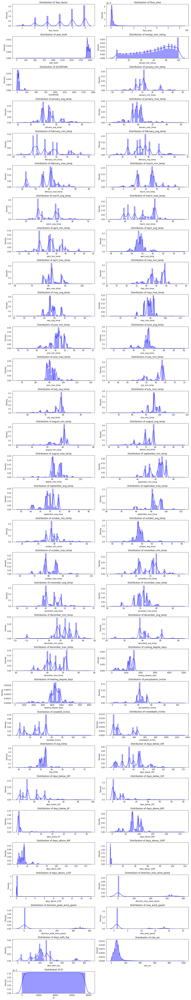

In [690]:
warnings.filterwarnings("ignore")
plt.figure(figsize=(15,80))
for i, col in enumerate(num_columns):
    plt.subplot(32,2,i+1); sns.distplot(df[col], color='blue')
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

In [691]:
pd.set_option('display.max_columns', None)
df[num_columns].describe()

,Year_Factor,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,february_max_temp,march_min_temp,march_avg_temp,march_max_temp,april_min_temp,april_avg_temp,april_max_temp,may_min_temp,may_avg_temp,may_max_temp,june_min_temp,june_avg_temp,june_max_temp,july_min_temp,july_avg_temp,july_max_temp,august_min_temp,august_avg_temp,august_max_temp,september_min_temp,september_avg_temp,september_max_temp,october_min_temp,october_avg_temp,october_max_temp,november_min_temp,november_avg_temp,november_max_temp,december_min_temp,december_avg_temp,december_max_temp,cooling_degree_days,heating_degree_days,precipitation_inches,snowfall_inches,snowdepth_inches,avg_temp,days_below_30F,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
count,75757.000000,7.575700e+04,73920.000000,49048.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,34675.000000,33946.000000,34675.000000,29961.000000,75757.000000,75757.000000
mean,4.367755,1.659839e+05,1952.306764,61.048605,39.506323,11.432343,34.310468,59.054952,11.720567,35.526837,58.486278,21.606281,44.469292,70.897831,32.037171,53.784863,82.661932,44.706179,63.742547,88.987856,51.131763,71.066384,91.400280,60.571604,76.596879,95.543950,58.515068,75.348749,92.572581,50.791689,69.597545,92.171139,38.210911,58.727038,81.135671,28.630397,48.123133,71.202397,22.736777,41.625569,64.496852,1202.250446,4324.957390,42.430651,29.136379,164.862455,56.176705,48.756511,17.447932,4.886532,0.876764,82.709809,14.058701,0.279539,0.002442,66.552675,62.779974,4.190601,109.142051,82.584693,37878.000000
std,1.471441,2.468758e+05,37.053619,28.663683,60.656596,9.381027,6.996108,5.355458,12.577272,8.866697,8.414611,10.004303,6.657142,7.680982,5.577279,2.500473,4.101028,4.200319,2.792919,2.864669,3.415926,2.861681,3.604068,4.177109,4.090275,4.157118,4.441992,3.818895,4.139685,4.290884,3.603773,5.011708,5.093899,2.641300,5.579513,7.153244,4.094207,4.373374,9.014047,5.869386,6.054104,391.561780,824.366727,10.592205,17.810894,175.275869,2.241940,27.587124,14.469435,7.071221,2.894244,25.282913,10.943996,2.252323,0.142140,131.147834,130.308106,6.458789,50.699751,58.255403,21869.306509
min,1.000000,9.430000e+02,0.000000,0.000000,-6.400000,-19.000000,10.806452,42.000000,-13.000000,13.250000,38.000000,-9.000000,25.854839,53.000000,15.000000,40.280000,62.000000,23.000000,46.950000,64.000000,30.000000,54.100000,67.000000,37.000000,54.822581,65.000000,31.000000,56.693548,66.000000,26.000000,53.600000,64.000000,18.000000,44.693548,59.000000,4.000000,30.766667,53.000000,-16.000000,23.790323,42.000000,0.000000,398.000000,0.000000,0.000000,0.000000,44.512329,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,12.000000,1.001169,0.000000
25%,3.000000,6.237900e+04,1927.000000,40.000000,11.900000,6.000000,29.827586,56.000000,2.000000,31.625000,55.000000,13.000000,38.096774,62.000000,26.000000,52.333333,80.000000,42.000000,62.790323,88.000000,50.000000,70.983333,89.000000,57.000000,76.145161,95.000000,57.000000,74.516129,90.000000,47.000000,68.200000,91.000000,35.000000,58.048387,78.000000,23.000000,45.250000,69.000000,17.000000,38.532258,60.000000,1128.000000,3978

### Main Findings

From these distribution plots and the descriptive statistics, the following observations are made:

* **The distribution of the site_eui follows a normal distribution. However, the distribution is a little skewed by abnormally large values**
    * The mean is 82.58 and the median is 75.29. The largest value observed is 997.866


* **The buildings seem to reside in different climates
    * From the avg_temp descriptive statistics, the minimum value observed is 44.51F, and the maximum observed is 77.27. This tells us that some of the buildings reside in climates that have harser and collder winters
    * Moreover, the 25th percentile is 55.147 and the 75th percentile is 57.12. This tells us that, there could be a disproportionately large amount of buildings that reside in a certain states which have similar climates, which caused the difference between the 25th percentile and 75th percentile to be so tight.
    

* **There is a good distribution in terms to the age of the houses**
    * From the year_built descriptive statistics, the 25th percentile is 1927, the 50th percentile is 1951, the 75th percentile is 1977, and the max is 2005. Thus, this shows that there is a good variance in the age of the house and it will be interesting to see how that reflects in their EUI
    * However, also from the year_built distribution, the minimum value observed is 0, which seems to be an error. We shall look into these rows, and if the number of data points that display this value is small, we can look to remove them from the dataset. 
      
    
* **35.26% of the buildings do not have an Energy_star_rating**
    * According to the energy star official website, the energy star rating score compares your building to other buildings nationaaide that have the same primary use. It is a tool that allows you to quickly understand how your building is performing. A score of 50 represents median energy performance, while a score of 75 or higher indicates your building is a top performer — and may be eligible for ENERGY STAR certification.
        * This means that, to score an energy_star_rating, the process does not have to be vetted through the certification body. Vetting through the certification body is only needed if the organization wants its building to attain the Energy Star Rating
        * Thus, for these buildings that do not have an energy_star_rating, this does not necessarily mean that the building is not energy efficient. 
    * Also, another point to note is that the minimum value observed is 0. According to the site, the lowest score possible is 1.
        * We shall zoom in on this value and decide how to address these data points, along with the Null values. 
    
[energy star rating](https://www.energystar.gov/buildings/benchmark/understand_metrics/how_score_calculated)    


* **We would also drop 'id' from the dataset**
    * id is simply just the identification number of the building and is not a useful feature for modeling


In [775]:
pd.set_option('display.max_columns', None)
df.loc[df['year_built']==0,:]

# There are 5 rows whereby the year built is 0, which are not possible. Since the number of such rows are small, 
# we will just drop these rows.

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,february_max_temp,march_min_temp,march_avg_temp,march_max_temp,april_min_temp,april_avg_temp,april_max_temp,may_min_temp,may_avg_temp,may_max_temp,june_min_temp,june_avg_temp,june_max_temp,july_min_temp,july_avg_temp,july_max_temp,august_min_temp,august_avg_temp,august_max_temp,september_min_temp,september_avg_temp,september_max_temp,october_min_temp,october_avg_temp,october_max_temp,november_min_temp,november_avg_temp,november_max_temp,december_min_temp,december_avg_temp,december_max_temp,cooling_degree_days,heating_degree_days,precipitation_inches,snowfall_inches,snowdepth_inches,avg_temp,days_below_30F,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
353,1,State_1,Commercial,Lodging_Hotel,204392.0,0.0,61.0,59.1,36,50.500000,68,35,50.589286,73,40,53.693548,80,41,55.500000,78,46,56.854839,84,50,60.500000,90,52,62.725806,84,52,62.161290,85,52,64.650000,90,47,63.016129,83,43,53.800000,72,36,49.274194,71,115,2960,16.59,0.0,0,56.972603,0,0,0,0,14,0,0,0,NaN,NaN,NaN,NaN,82.627179,353
955,2,State_1,Commercial,Lodging_Hotel,204392.0,0.0,63.0,2.4,27,48.951613,69,33,51.655172,78,34,52.822581,74,37,58.850000,90,45,64.612903,92,49,67.900000,103,53,70.467742,99,52,71.806452,100,49,68.466667,97,43,63.983871,100,35,55.283333,79,28,47.919355,65,791,2439,19.27,0.0,0,60.247268,3,0,0,0,113,35,1,0,1.0,1.0,1.0,88.0,87.526794,955
2159,3,State_1,Commercial,Lodging_Hotel,204392.0,0.0,63.0,9.1,22,44.790323,65,25,47.892857,71,32,53.112903,79,34,58.866667,87,35,62.096774,91,44,66.283333,99,48,65.693548,91,45,67.080645,92,42,65.950000,96,35,56.967742,85,31,52.516667,76,16,43.338710,68,303,3108,4.16,0.0,0,57.082192,33,2,0,0,72,10,0,0,NaN,NaN,NaN,NaN,75.362740,2159
3415,4,State_1,Commercial,Lodging_Hotel,204392.0,0.0,68.0,9.1,41,55.096774,73,42,54.875000,71,47,59.032258,76,47,60.100000,90,51,63.483871,92,52,64.250000,87,53,66.903226,90,57,67.016129,80,56,68.383333,83,55,68.661290,95,46,59.650000,76,41,56.790323,68,497,1477,20.69,0.0,0,62.067123,0,0,0,0,27,6,0,0,NaN,NaN,NaN,NaN,61.793699,3415
4535,5,State_1,Commercial,Lodging_Hotel,204392.0,0.0,76.0,9.1,29,51.387097,77,36,56.803571,75,40,61.435484,85,41,60.966667,91,45,62.887097,90,55,72.983333,106,60,74.516129,103,58,74.774194,104,53,73.583333,105,49,69.580645,96,29,52.866667,75,28,48.580645,68,1319,1823,7.95,0.0,0,63.398630,4,0,0,0,136,52,10,0,NaN,NaN,NaN,NaN,59.503653,4535
5571,6,State_1,Commercial,Lodging_Hotel,204392.0,0.0,78.0,45.7,37,52.693548,62,42,56.948276,75,47,57.725806,76,47,60.283333,86,51,61.064516,87,51,63.350000,87,53,62.919355,81,53,63.790323,76,52,64.800000,94,51,63.354839,84,44,58.283333,75,36,50.661290,63,142,2005,21.39,0.0,0,59.648907,0,0,0,0,16,2,0,0,NaN,NaN,NaN,NaN,60.833333,5571


In [693]:
pd.set_option('display.max_columns', None)
df.loc[df['energy_star_rating']==0,:]

# According to this source 'https://www.energystar.gov/buildings/benchmark/understand_metrics/how_score_calculated'
# the lowest energy star rating score that a building can obtain is 1. Since there is only 1 row whereby the
# energy star rating is 0, we will just drop this row

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,february_max_temp,march_min_temp,march_avg_temp,march_max_temp,april_min_temp,april_avg_temp,april_max_temp,may_min_temp,may_avg_temp,may_max_temp,june_min_temp,june_avg_temp,june_max_temp,july_min_temp,july_avg_temp,july_max_temp,august_min_temp,august_avg_temp,august_max_temp,september_min_temp,september_avg_temp,september_max_temp,october_min_temp,october_avg_temp,october_max_temp,november_min_temp,november_avg_temp,november_max_temp,december_min_temp,december_avg_temp,december_max_temp,cooling_degree_days,heating_degree_days,precipitation_inches,snowfall_inches,snowdepth_inches,avg_temp,days_below_30F,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
524,2,State_1,Commercial,Commercial_Other,25500.0,1925.0,0.0,2.4,27,48.951613,69,33,51.655172,78,34,52.822581,74,37,58.85,90,45,64.612903,92,49,67.9,103,53,70.467742,99,52,71.806452,100,49,68.466667,97,43,63.983871,100,35,55.283333,79,28,47.919355,65,791,2439,19.27,0.0,0,60.247268,3,0,0,0,113,35,1,0,1.0,1.0,1.0,88.0,288.83913,524


In [694]:
df.loc[df['site_eui']>500,:]

# To create a better prediction model, we need to remove outliers from our dataset. We will drop the data points 
# whereby the site_eui is more than 500. (There are 208 such data points)

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,february_max_temp,march_min_temp,march_avg_temp,march_max_temp,april_min_temp,april_avg_temp,april_max_temp,may_min_temp,may_avg_temp,may_max_temp,june_min_temp,june_avg_temp,june_max_temp,july_min_temp,july_avg_temp,july_max_temp,august_min_temp,august_avg_temp,august_max_temp,september_min_temp,september_avg_temp,september_max_temp,october_min_temp,october_avg_temp,october_max_temp,november_min_temp,november_avg_temp,november_max_temp,december_min_temp,december_avg_temp,december_max_temp,cooling_degree_days,heating_degree_days,precipitation_inches,snowfall_inches,snowdepth_inches,avg_temp,days_below_30F,days_below_20F,days_below_10F,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
13,1,State_1,Commercial,Data_Center,616793.0,1955.0,13.0,2.4,36,50.500000,68,35,50.589286,73,40,53.693548,80,41,55.500000,78,46,56.854839,84,50,60.500000,90,52,62.725806,84,52,62.161290,85,52,64.650000,90,47,63.016129,83,43,53.800000,72,36,49.274194,71,115,2960,16.59,0.0,0,56.972603,0,0,0,0,14,0,0,0,1.0,1.0,1.0,NaN,608.839519,13
359,2,State_1,Commercial,Education_Uncategorized,5000.0,NaN,NaN,29.6,45,64.274194,89,39,59.310345,82,42,57.758065,85,43,60.466667,82,51,62.290323,76,55,64.016667,76,54,66.403226,85,58,73.096774,88,59,73.750000,98,53,69.774194,93,47,63.016667,90,43,56.677419,71,940,1125,10.43,0.0,0,64.251366,0,0,0,0,70,5,0,0,NaN,NaN,NaN,NaN,910.563198,359
923,2,State_1,Commercial,Commercial_Other,42200.0,1988.0,1.0,2.4,27,48.951613,69,33,51.655172,78,34,52.822581,74,37,58.850000,90,45,64.612903,92,49,67.900000,103,53,70.467742,99,52,71.806452,100,49,68.466667,97,43,63.983871,100,35,55.283333,79,28,47.919355,65,791,2439,19.27,0.0,0,60.247268,3,0,0,0,113,35,1,0,1.0,1.0,1.0,88.0,608.591065,923
930,2,State_1,Commercial,Data_Center,616793.0,1955.0,14.0,2.4,27,48.951613,69,33,51.655172,78,34,52.822581,74,37,58.850000,90,45,64.612903,92,49,67.900000,103,53,70.467742,99,52,71.806452,100,49,68.466667,97,43,63.983871,100,35,55.283333,79,28,47.919355,65,791,2439,19.27,0.0,0,60.247268,3,0,0,0,113,35,1,0,1.0,1.0,1.0,88.0,616.121303,930
1291,3,State_1,Commercial,Data_Center,616793.0,1955.0,19.0,2.4,26,44.516129,64,30,49.392857,69,37,55.967742,77,40,61.783333,90,45,65.129032,91,52,70.016667,104,52,71.387097,102,54,71.322581,97,47,69.133333,98,43,61.000000,84,36,55.116667,77,24,45.387097,68,826,2542,4.50,0.0,0,60.056164,20,0,0,0,111,31,5,0,NaN,NaN,NaN,NaN,656.063562,1291
2486,4,State_1,Commercial,Commercial_Other,42200.0,1988.0,1.0,2.4,36,54.451613,74,37,55.428571,74,45,59.919355,79,44,61.016667,91,51,65.677419,92,52,67.066667,88,55,69.661290,95,58,68.870968,83,54,68.800000,86,48,66.306452,93,42,58.316667,77,35,55.387097,71,643,1427,15.59,0.0,0,62.620548,0,0,0,0,42,7,0,0,NaN,NaN,NaN,NaN,707.685753,2486
2505,4,State_1,Commercial,Data_Center,616793.0,1955.0,24.0,2.4,36,54.451613,74,37,55.428571,74,45,59.919355,79,44,61.016667,91,51,65.677419,92,52,67.066667,88,55,69.661290,95,58,68.870968,83,54,68.800000,86,48,66.306452,93,42,58.316667,77,35,55.387097,71,643,1427,15.59,0.0,0,62.620548,0,0,0,0,42,7,0,0,NaN,NaN,NaN,NaN,752.066575,2505
3582,5,State_1,Commercial,Commercial_Other,42200.0,1988.0,1.0,2.4,29,51.387097,77,36,56.803571,75,40,61.435484,85,41,60.966667,91,45,62.887097,90,55,72.983333,106,60,74.516129,103,58,74.774194,104,53,73.583333,105,49,69.580645,96,29,52.866667,75,28,48.580645,68,1319,1823,7.95,0.0,0,63.398630,4,0,0,0,136,52,10,0,NaN,NaN,NaN,NaN,702.637911,3582
3599,5,State_1,Commercial,Data_Center,616793.0,1955.0,20.0,2.4,29,51.387097,77,36,56.803571,75,40,61.435484,85,41,60.966667,91,45,62.887097,90,55,72.983333,106,60,74.516129,103,58,74.774194,104,53,73.583333,105,49,69.580645,96,29,52.866667,75,28,48.580645,68,1319,1823,7.95,0.0,0,63.3986

In [776]:
df = df.loc[df['year_built']!=0,:]
df = df.loc[df['energy_star_rating']!=0,:]
df = df.loc[df['site_eui']<=500,:]

In [777]:
df.drop('id', inplace = True, axis = 1)
# drop the 'id' column

In [738]:
df.shape
# check that the datapoints as mentioned above have been dropped

(75542, 63)

In [739]:
num_columns = list(df.select_dtypes(include=[np.number]).columns)
# update the list of numerical columns

### Distribution - Numeric Features vs EUI
Next, to help us in our analysis, we plot the relationship between the EUI and each of the numeric features. We shall also calculate the median EUI and plot it on the respective graphs to serve as a reference point. We use median EUI as from our findings in the previous section, the distribution is a little skewed due to outliers

In [629]:
def calc_median_EUI(dataframe, column_names=None):
    if column_names != None:
        median_EUI = dataframe.groupby(column_names)['site_eui'].median()  
    else:       
        median_EUI = dataframe['site_eui'].median() 
    return round(median_EUI,2)

In [630]:
overall_median_EUI = calc_median_EUI(df)
print(f'The median EUI for the full dataset is : {overall_median_EUI}')

The median EUI for the full dataset is : 75.19


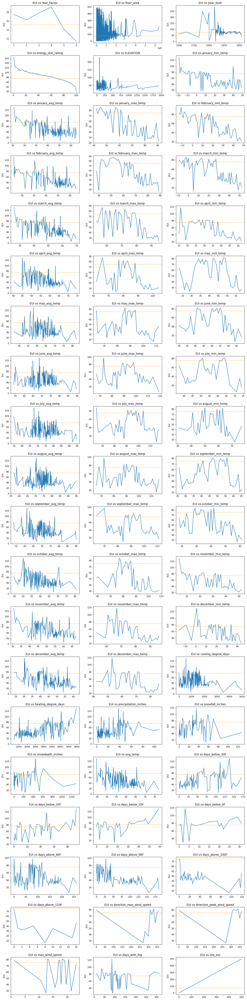

In [632]:
plt.figure(figsize=(15, 66), dpi=80)

for i, col in enumerate(num_columns): 
    eui = calc_median_EUI(df, [col])
    plt.subplot(22,3,i+1);plt.plot(eui.index, eui);plt.ylabel('EUI') 
    plt.title(f'EUI vs {col}')
    # plot the overall median so we can use that as a reference point
    plt.axhline(y=overall_median_EUI, color='orange', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Main Findings

* **For the feature Year_Factor, Year_Factor 5 and Year_Factor 6 peforms best, wehereby the observed median EUI is noticeably below the overall median**
    * Though this information is useful to know, it may not be that relevant to our final model as the Years are anonymized. Furthermore, the effect that the 'Year_Factor' has on the EUI should already be conveyed through the weather data. Thus, we can look to drop this feature


* **For the feature floor_area, there seems to be less fluctuation as the size of the building or its floor area increases, and the EUI tends to be higher than the overall median.**
    * This could be that for larger buildings, it is more likely that it will not be as energy efficient as smaller buildings since there are more considerations to factor for.


* **For the feature year_buit, there is less fluctuation observed in the EUI for the builings that were built after 1900. There is much greater fluctuation observed in the EUI for the buildings that were built before 1900.**
    * A possible reason could be that for the much older builings, some may have been retrofitted or upgraded with energy saving equipment and the others did not.
    
    
* **For energy_star_rating, buildings with a rating of less than ~60 have median EUI worse than the overall median, whereas buildings with a rating of more than 60 have median EUI better than the overall median**
    * This makes sense as having a better energy rating score naturally translates to more efficient energy use by the building, hence the better EUI score.
    

* **For cooling_degree_days, EUI shows a slight decreasing trend (EUI scores better) as the amount of cooling_degree_days increases. For heating_degree_days, EUI shows an slight incresing trend (EUI scores worse) as the amount of heating_degree_day increases**
    * This could be because prolonged cold weather caused higher energy consumption (due to usage of heating appliances).


* **For precipitation_inches, snowfall_inches and snow_depth_inches, there seems be an ever slight increasing trend (EUI scores worse)**
    * As rainfall and snowfall increases, people are more likely to remain indoors, which will increase the energy usage of the building.
    

* **For days_below_20F, days_below_10F, days_below_0F, EUI shows an increasing trend (EUI scores worse)**
    * As the number of such days increases, the heating appliances are used more to combat the cold, which would increse the energy usage.
    
    
* **For days_above_80F, days_above_90F, days_above_100F, there seems to be a decreasing trend (EUI scores better)**
    * This goes against our initial thoughts as we felt that energy usage would increase as air-conditioning would be used more as the weather becomes warmer.
        * However, it also could be that, such days are more frequent during the summer months, which is usually the downtime of the year for certain facilities (school summer break, holidays etc.)


* **For features related to Min, Avg and Max temperature for each month, during the summer months, there does not seem to be a distinctive relationship between them and EUI. For the winter months, however, EUI shows a decreasing trend (EUI scores better).**
    * In regards to the winter months, this is likely because the heating appliances do not have to work as hard and thus use less energy when it gets less cold.
    * We shall dive deeper into these columns in the next section

### Heatplot of Temperature Columns

We plot a correlation heatmap of the temperature columns, and also site_eui, to see the correlaton coefficients for them. For temperature columns, we have the minimum, average and maximum temperature for each month from January to December for the different Year_Factor.

Our hypothesis is that the minimum, average and maximum temperature for each month has a high correlaton to each other and we can consider dropping some to reduce multicollinearity

In [202]:
df_temp_columns = df[['january_min_temp','january_avg_temp', 'january_max_temp','february_min_temp', 'february_avg_temp', 
                      'february_max_temp','march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
                      'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp','may_max_temp', 
                      'june_min_temp', 'june_avg_temp', 'june_max_temp','july_min_temp', 'july_avg_temp', 
                      'july_max_temp', 'august_min_temp','august_avg_temp', 'august_max_temp', 'september_min_temp',
                      'september_avg_temp', 'september_max_temp', 'october_min_temp','october_avg_temp', 
                      'october_max_temp', 'november_min_temp','november_avg_temp', 'november_max_temp', 
                      'december_min_temp','december_avg_temp', 'december_max_temp','avg_temp','site_eui']]

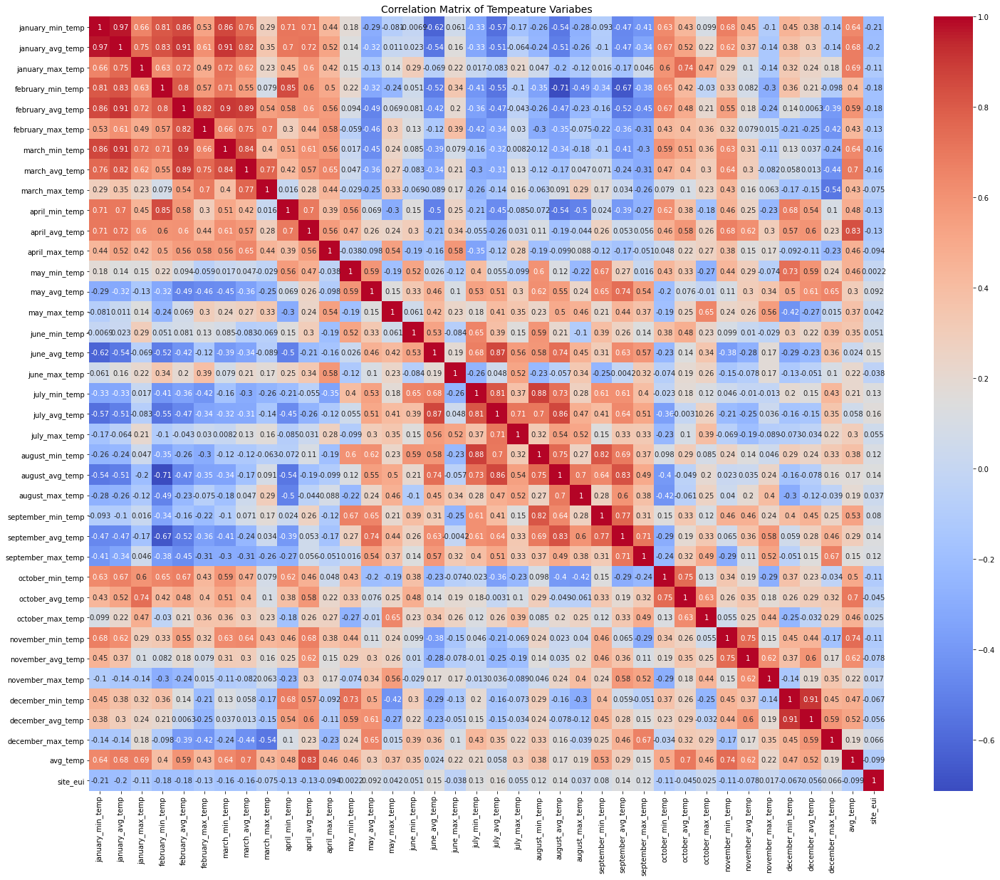

In [216]:
plt.figure(figsize = (25,20))
plt.title('Correlation Matrix of Tempeature Variabes', fontsize = 14)
sns.heatmap(df_temp_columns.corr(), annot = True, cmap = 'coolwarm');

In [204]:
df_temp_columns.corr()['site_eui'].sort_values(ascending=False)

site_eui              1.000000
july_avg_temp         0.161376
june_avg_temp         0.147326
august_avg_temp       0.141865
september_avg_temp    0.135529
july_min_temp         0.132874
september_max_temp    0.120172
august_min_temp       0.115543
may_avg_temp          0.091820
september_min_temp    0.079830
december_max_temp     0.066043
july_max_temp         0.055003
june_min_temp         0.050815
may_max_temp          0.042169
august_max_temp       0.037048
october_max_temp      0.024776
november_max_temp     0.016551
may_min_temp          0.002165
june_max_temp        -0.038300
october_avg_temp     -0.044702
december_avg_temp    -0.056082
december_min_temp    -0.066543
march_max_temp       -0.075187
november_avg_temp    -0.078240
april_max_temp       -0.094251
avg_temp             -0.099455
october_min_temp     -0.109821
january_max_temp     -0.113399
november_min_temp    -0.113990
february_max_temp    -0.129761
april_avg_temp       -0.131138
april_min_temp       -0.133737
march_av

In [205]:
df_temp_columns.corr()['site_eui'].sort_values(ascending=True)

january_min_temp     -0.210476
january_avg_temp     -0.197617
february_avg_temp    -0.182843
february_min_temp    -0.178352
march_min_temp       -0.157903
march_avg_temp       -0.157257
april_min_temp       -0.133737
april_avg_temp       -0.131138
february_max_temp    -0.129761
november_min_temp    -0.113990
january_max_temp     -0.113399
october_min_temp     -0.109821
avg_temp             -0.099455
april_max_temp       -0.094251
november_avg_temp    -0.078240
march_max_temp       -0.075187
december_min_temp    -0.066543
december_avg_temp    -0.056082
october_avg_temp     -0.044702
june_max_temp        -0.038300
may_min_temp          0.002165
november_max_temp     0.016551
october_max_temp      0.024776
august_max_temp       0.037048
may_max_temp          0.042169
june_min_temp         0.050815
july_max_temp         0.055003
december_max_temp     0.066043
september_min_temp    0.079830
may_avg_temp          0.091820
august_min_temp       0.115543
september_max_temp    0.120172
july_min

### Main Findings

* **From the heatmap, we can dedude that the minimum, average and maximum temperature for each month do have a fairly high correlation with one another.**
    * This is evidenced by the presence of red boxes from diagonal top left to the bottom right of the heatmap


* **There is no temperature columns that have a highly correlation with site_eui**
   * For temperature columns that have a postive correlation with site_eui:
        * The top 3 with the highest correlations are 'july_avg_temp', 'june_avg_temp' and 'august_avg_temp' with coefficients of 0.161, 0.147 and 0.142 respectively
   * For temperature columns that have a negative correlation with site_eui:
        * The top 3 with the highest correlations are 'janurary_min_temp', 'january_avg_temp' and 'february_avg_temp' with coefficients of -0.210, -0.197 and -0.183 respectively
        

* **Following up from the previous point, another interesting observation is that the months that causes the site_eui to be numerically larger (which means the building consumes more energy/less energy efficienct) lie in the middle of the year (july_avg_temp, june_avg_temp, august_avg_temp), while the months that causes the site_eui to be numerically smaller (which means the building consumes less energy/more energy efficient) lie towards the ends of the year (janurary_min_temp, january_avg_temp, february_avg_temp).**
    * This could be because during the warmer months (middle of the year), the builings are more likely to use air-conditioning. 
    * However, during the colder months (at the ends of the year), we would think that the buildings are more likely to use heating appliances, which according online sources, can also be equally or if not more energy demanding. 
    
[Heater Or AC: Which Uses More Electricity?](https://hvacseer.com/heater-or-ac-which-uses-more-electricity/)


* **To investigate this further, we shall take a closer took at the temperatures and deduce what states the buildings are likely to be located in**

### What states/climates do the different state_factors belong to?

To answer this question, we first filter the dataset by the different states that the buildings belong to, which are:
1. State_1
2. State_2
3. State_4
4. State_6
5. State_8
6. State_10
7. State_11

Next, we group the datasets by the Year_Factor and calculate the mean monthly average temperature, as well as the mean average temperature.



In [206]:
df['Year_Factor'].unique()

array([1, 2, 3, 4, 5, 6])

In [207]:
df['State_Factor'].unique()

array(['State_1', 'State_2', 'State_4', 'State_6', 'State_8', 'State_10',
       'State_11'], dtype=object)

##### State_1

In [123]:
df_state_1 = df.loc[df['State_Factor'] == 'State_1',:]
df_state_1.groupby('Year_Factor').agg({'avg_temp':'mean','january_avg_temp' : "mean",'february_avg_temp' : "mean",
                                       'march_avg_temp' : "mean",'april_avg_temp' : "mean",'may_avg_temp' : "mean",
                                       'june_avg_temp' : "mean",'july_avg_temp' : "mean",
                                       'august_avg_temp' : "mean",'september_avg_temp' : "mean",
                                       'october_avg_temp' : "mean",'november_avg_temp' : "mean",
                                       'december_avg_temp' : "mean"
})


,avg_temp,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,may_avg_temp,june_avg_temp,july_avg_temp,august_avg_temp,september_avg_temp,october_avg_temp,november_avg_temp,december_avg_temp
Year_Factor,,,,,,,,,,,,,
1,56.972603,50.500000,50.589286,53.693548,55.500000,56.854839,60.500000,62.725806,62.161290,64.650000,63.016129,53.800000,49.274194
2,60.558790,49.249228,51.780011,52.972676,58.966416,64.806997,68.182880,70.904920,72.491224,69.176656,64.253925,55.517059,48.139354
3,58.896385,45.475196,48.832786,54.776761,60.217771,63.760328,68.313788,69.047574,69.487742,67.863899,59.099922,54.163858,45.205850
4,62.607555,55.078845,55.014954,59.153001,60.524645,64.483878,65.768288,68.824856,68.575825,69.414209,68.316349,59.398016,56.148588
5,63.398630,51.387097,56.803571,61.435484,60.966667,62.887097,72.983333,74.516129,74.774194,73.583333,69.580645,52.866667,48.580645
6,59.648907,52.693548,56.948276,57.725806,60.283333,61.064516,63.350000,62.919355,63.790323,64.800000,63.354839,58.283333,50.661290


##### State_2

In [125]:
df_state_2 = df.loc[df['State_Factor'] == 'State_2',:]
df_state_2.groupby('Year_Factor').agg({'avg_temp':'mean','january_avg_temp' : "mean",'february_avg_temp' : "mean",
                                       'march_avg_temp' : "mean",'april_avg_temp' : "mean",'may_avg_temp' : "mean",
                                       'june_avg_temp' : "mean",'july_avg_temp' : "mean",
                                       'august_avg_temp' : "mean",'september_avg_temp' : "mean",
                                       'october_avg_temp' : "mean",'november_avg_temp' : "mean",
                                       'december_avg_temp' : "mean"
})


,avg_temp,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,may_avg_temp,june_avg_temp,july_avg_temp,august_avg_temp,september_avg_temp,october_avg_temp,november_avg_temp,december_avg_temp
Year_Factor,,,,,,,,,,,,,
1,57.835165,30.645161,37.339286,45.645161,59.400000,67.983871,75.850000,81.580645,76.951613,69.833333,55.306452,49.933333,41.816667
2,58.519126,37.903226,41.637931,54.322581,55.650000,69.161290,72.550000,80.983871,77.435484,69.066667,56.903226,42.833333,42.887097
3,55.833333,37.500000,35.732143,41.145161,56.583333,62.903226,73.866667,79.322581,73.783333,67.160000,58.816667,44.316667,39.500000
4,54.651685,28.290323,34.107143,37.951613,54.450000,65.034483,74.483333,76.033333,73.550000,69.172414,59.183333,43.357143,40.350000
5,56.427954,29.966667,25.018519,38.448276,55.379310,69.706897,75.034483,77.500000,75.816667,72.448276,55.767857,51.339286,48.850000
6,57.443182,32.000000,35.907407,49.693548,54.870370,61.750000,74.293103,79.903226,79.550000,73.275862,60.053571,47.879310,39.033333


##### State_4

In [126]:
df_state_4 = df.loc[df['State_Factor'] == 'State_4',:]
df_state_4.groupby('Year_Factor').agg({'avg_temp':'mean','january_avg_temp' : "mean",'february_avg_temp' : "mean",
                                       'march_avg_temp' : "mean",'april_avg_temp' : "mean",'may_avg_temp' : "mean",
                                       'june_avg_temp' : "mean",'july_avg_temp' : "mean",
                                       'august_avg_temp' : "mean",'september_avg_temp' : "mean",
                                       'october_avg_temp' : "mean",'november_avg_temp' : "mean",
                                       'december_avg_temp' : "mean"
})


,avg_temp,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,may_avg_temp,june_avg_temp,july_avg_temp,august_avg_temp,september_avg_temp,october_avg_temp,november_avg_temp,december_avg_temp
Year_Factor,,,,,,,,,,,,,
4,47.354607,15.173457,16.769166,31.017428,48.322409,60.172039,70.825575,69.987069,73.318479,63.705086,51.850042,33.298851,31.904616
5,49.785712,21.629885,15.319679,33.963156,48.730918,60.545850,66.026205,70.948111,71.254342,68.861699,54.010369,44.275247,39.479418
6,53.144653,24.731126,29.682751,44.115058,48.876348,61.389568,72.957434,76.835434,77.282356,70.545300,57.517117,46.790546,24.588623


##### State_6

In [127]:
df_state_6 = df.loc[df['State_Factor'] == 'State_6',:]
df_state_6.groupby('Year_Factor').agg({'avg_temp':'mean','january_avg_temp' : "mean",'february_avg_temp' : "mean",
                                       'march_avg_temp' : "mean",'april_avg_temp' : "mean",'may_avg_temp' : "mean",
                                       'june_avg_temp' : "mean",'july_avg_temp' : "mean",
                                       'august_avg_temp' : "mean",'september_avg_temp' : "mean",
                                       'october_avg_temp' : "mean",'november_avg_temp' : "mean",
                                       'december_avg_temp' : "mean"
})


,avg_temp,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,may_avg_temp,june_avg_temp,july_avg_temp,august_avg_temp,september_avg_temp,october_avg_temp,november_avg_temp,december_avg_temp
Year_Factor,,,,,,,,,,,,,
1,56.519178,29.677419,36.035714,42.322581,54.300000,64.483871,72.316667,80.241935,75.274194,70.033333,57.096774,51.883333,43.306452
2,57.366046,37.322561,40.879053,50.935098,54.766509,65.096550,70.983136,78.757823,76.693384,68.799922,58.048632,43.867077,41.467858
3,55.448147,35.079456,33.909750,40.144170,52.982166,62.789139,72.648841,79.837689,74.595458,67.865202,60.192248,45.248998,38.547141
4,54.499976,28.595446,31.623725,37.659635,52.331945,63.998603,72.448454,76.143854,74.514460,69.731870,59.627680,45.298673,40.515033
5,56.834483,29.853963,23.945272,38.095638,54.248747,68.515031,71.182317,78.788998,78.966389,74.448789,58.047333,52.782312,50.773097
6,57.214653,34.450411,37.705787,48.869912,53.332196,62.789346,72.248871,78.676178,79.175997,71.798625,58.756840,49.765420,38.337505


##### State_8

In [128]:
df_state_8 = df.loc[df['State_Factor'] == 'State_8',:]
df_state_8.groupby('Year_Factor').agg({'avg_temp':'mean','january_avg_temp' : "mean",'february_avg_temp' : "mean",
                                       'march_avg_temp' : "mean",'april_avg_temp' : "mean",'may_avg_temp' : "mean",
                                       'june_avg_temp' : "mean",'july_avg_temp' : "mean",
                                       'august_avg_temp' : "mean",'september_avg_temp' : "mean",
                                       'october_avg_temp' : "mean",'november_avg_temp' : "mean",
                                       'december_avg_temp' : "mean"
})


,avg_temp,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,may_avg_temp,june_avg_temp,july_avg_temp,august_avg_temp,september_avg_temp,october_avg_temp,november_avg_temp,december_avg_temp
Year_Factor,,,,,,,,,,,,,
3,53.082192,32.903226,32.160714,38.451613,51.600000,61.467742,71.633333,78.419355,71.741935,64.466667,56.806452,41.683333,34.177419
4,55.400692,28.745281,32.614035,37.671963,54.629218,65.364875,74.791358,78.005615,74.751892,70.629547,60.341458,43.727366,40.800677
5,50.810828,24.206777,19.099937,32.668152,49.626389,64.276457,68.442178,72.850806,71.275962,68.752836,51.209111,44.703289,43.155065
6,53.942101,29.796531,33.937422,46.099435,49.993096,59.225013,70.457040,76.929692,75.819266,68.450216,55.521450,44.852216,35.226740


##### State_10

In [129]:
df_state_10 = df.loc[df['State_Factor'] == 'State_10',:]
df_state_10.groupby('Year_Factor').agg({'avg_temp' : 'mean','january_avg_temp' : "mean",'february_avg_temp' : "mean",
                                       'march_avg_temp' : "mean",'april_avg_temp' : "mean",'may_avg_temp' : "mean",
                                       'june_avg_temp' : "mean",'july_avg_temp' : "mean",
                                       'august_avg_temp' : "mean",'september_avg_temp' : "mean",
                                       'october_avg_temp' : "mean",'november_avg_temp' : "mean",
                                       'december_avg_temp' : "mean"
})


,avg_temp,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,may_avg_temp,june_avg_temp,july_avg_temp,august_avg_temp,september_avg_temp,october_avg_temp,november_avg_temp,december_avg_temp
Year_Factor,,,,,,,,,,,,,
3,58.901370,40.274194,38.339286,43.806452,58.883333,66.661290,76.466667,81.241935,77.080645,71.316667,62.403226,46.633333,42.290323
4,58.557534,32.241935,37.821429,42.854839,57.333333,68.451613,77.233333,79.403226,77.661290,73.833333,62.887097,47.950000,43.725806
5,60.272603,35.596774,30.285714,45.274194,59.383333,73.225806,78.100000,81.467742,79.274194,74.866667,58.854839,53.666667,51.177419
6,60.405738,34.935484,39.879310,53.532258,56.866667,63.887097,76.216667,82.725806,82.741935,75.983333,63.080645,52.550000,41.790323


##### State_11

In [130]:
df_state_11 = df.loc[df['State_Factor'] == 'State_11',:]
df_state_11.groupby('Year_Factor').agg({'avg_temp' : 'mean','january_avg_temp' : "mean",'february_avg_temp' : "mean",
                                       'march_avg_temp' : "mean",'april_avg_temp' : "mean",'may_avg_temp' : "mean",
                                       'june_avg_temp' : "mean",'july_avg_temp' : "mean",
                                       'august_avg_temp' : "mean",'september_avg_temp' : "mean",
                                       'october_avg_temp' : "mean",'november_avg_temp' : "mean",
                                       'december_avg_temp' : "mean"
})


,avg_temp,january_avg_temp,february_avg_temp,march_avg_temp,april_avg_temp,may_avg_temp,june_avg_temp,july_avg_temp,august_avg_temp,september_avg_temp,october_avg_temp,november_avg_temp,december_avg_temp
Year_Factor,,,,,,,,,,,,,
5,55.673116,45.400628,48.300040,50.706028,51.822433,59.061852,67.069278,70.903650,68.391990,60.410519,57.484953,44.444056,43.402432
6,55.094377,43.400857,47.627782,49.295150,56.222177,59.142112,63.513391,66.891664,68.562438,61.328039,55.346081,51.234218,38.471568


In [139]:
df['Year_Factor'].unique()

array([1, 2, 3, 4, 5, 6])

##### Annual State Temperature Averages

<img src="images/us_states_avg_temperature.png" style="height: 400px">

[*image source*](https://www.currentresults.com/Weather/US/average-annual-state-temperatures.php)

### Main Findings

|State|Minimum Avg Temperature|Maximum Avg Temperature|Climate|
|---|---|---|---|
|1|56.97|63.40|Subtropical| 
|2|54.65|58.52|Subtropical| 
|4|47.35|53.14|Temperate| 
|6|54.50|57.37|Temperate| 
|8|50.81|55.40|Temperate| 
|10|58.56|60.41|Subtropical| 
|11|55.09|55.67|Subtropical| 


* **Out of these states, State_4 seems to enjoy the coolest temperatures, and State_1 seems to experience the warmest temperatures.**



* **From the range of average temperature values seen across the different year_factors for the various states, and comparing it to the infographic, 'Annual State Temperature Averages', we can conclude that the states reside in the subtropical and temperate climates.** 
    * For subtropical climates, these are characterized by hot and humid summers, and cool to mild winters
    * For temperate climates, there are characterized by mild to warm summers, and cool to cold winters.
    
[Temperate climates](https://www.sciencedirect.com/topics/earth-and-planetary-sciences/temperate-climate#:~:text=Temperate%20climates%20are%20generally%20defined,winters%20(Simmons%2C%202015).)

[Sub-tropical climates](https://en.wikipedia.org/wiki/Humid_subtropical_climate#:~:text=A%20humid%20subtropical%20climate%20is,poleward%20from%20adjacent%20tropical%20climates.)
    


* **More importantly, this gives credence to our earlier observation, which is that the middle months pushes the EUI numerically higher (more energy consumption/less energy efficienct), wherease the months towards the start and end of the year pulls the EUI numerically lower (less energy consumption/more energy efficient)**
    * During the summer/hotter months, buildings tend to run more air-conditioning and thus use more energy
    * During the cooler months, buildings in such climates (subtropical, temperate) are not likely to spend as much as  buidlings in other colder climates (cold semi-arid/continental) on heating since the temperatures do not drop that low. 

### Heatplot of the rest of the Numerical Columns

We plotted a correlation heatmap of the temperature columns. Now, we plot a correlation heatmap of the rest of the numerical columns and check for high and interesting coefficients. 



In [268]:
df_rest_of_num_columns = df[['floor_area', 'year_built', 'energy_star_rating', 'ELEVATION',
                             'cooling_degree_days','heating_degree_days', 'precipitation_inches', 
                             'snowfall_inches','snowdepth_inches', 'avg_temp', 'days_below_30F', 
                             'days_below_20F','days_below_10F', 'days_below_0F', 'days_above_80F', 
                             'days_above_90F','days_above_100F', 'days_above_110F', 
                             'direction_max_wind_speed','direction_peak_wind_speed', 'max_wind_speed', 
                             'days_with_fog','Year_Factor','site_eui']]

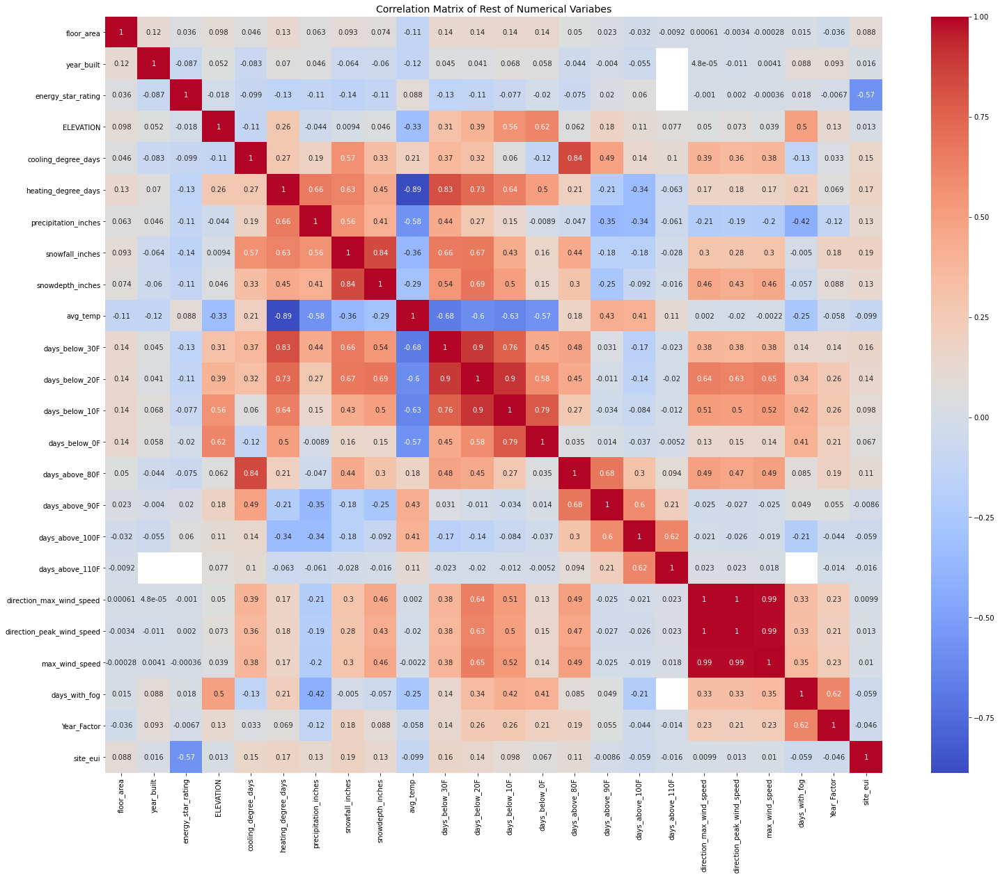

In [269]:
plt.figure(figsize = (25,20))
plt.title('Correlation Matrix of Rest of Numerical Variabes', fontsize = 14)
sns.heatmap(df_rest_of_num_columns.corr(), annot = True, cmap = 'coolwarm');

In [270]:
df_rest_of_num_columns.corr()['site_eui'].sort_values(ascending=False)

site_eui                     1.000000
snowfall_inches              0.186781
heating_degree_days          0.171433
days_below_30F               0.162697
cooling_degree_days          0.153063
days_below_20F               0.141207
snowdepth_inches             0.133902
precipitation_inches         0.125700
days_above_80F               0.106580
days_below_10F               0.098190
floor_area                   0.088243
days_below_0F                0.067114
year_built                   0.016408
ELEVATION                    0.013300
direction_peak_wind_speed    0.013245
max_wind_speed               0.009994
direction_max_wind_speed     0.009900
days_above_90F              -0.008552
days_above_110F             -0.016380
Year_Factor                 -0.046180
days_with_fog               -0.058515
days_above_100F             -0.059498
avg_temp                    -0.099455
energy_star_rating          -0.574164
Name: site_eui, dtype: float64

In [271]:
df_rest_of_num_columns.corr()['site_eui'].sort_values(ascending=True)

energy_star_rating          -0.574164
avg_temp                    -0.099455
days_above_100F             -0.059498
days_with_fog               -0.058515
Year_Factor                 -0.046180
days_above_110F             -0.016380
days_above_90F              -0.008552
direction_max_wind_speed     0.009900
max_wind_speed               0.009994
direction_peak_wind_speed    0.013245
ELEVATION                    0.013300
year_built                   0.016408
days_below_0F                0.067114
floor_area                   0.088243
days_below_10F               0.098190
days_above_80F               0.106580
precipitation_inches         0.125700
snowdepth_inches             0.133902
days_below_20F               0.141207
cooling_degree_days          0.153063
days_below_30F               0.162697
heating_degree_days          0.171433
snowfall_inches              0.186781
site_eui                     1.000000
Name: site_eui, dtype: float64

### Main Findings


* **For snowfall_inches and snowdepth_inches, there is high correlation between them (0.84). We will keep snowfall_inches and drop snowdepth_inches to reduce multicollinearity.**

    * We keep snowfall_inches as it has a numerically slightly higher/correlation with site_eui compared to snowdepth_inches (0.19 vs 0.13)
    
    
* **For direction_max_wind_speed, direction_peak_wind_speed and max_wind_speed, there is a very high correlation amongst them (0.99 & 1). We will drop at least 2 of these features.**
    * These 3 features have a high percentage of Null values. Also, all of them have very weak correlation with site_eui (0.0099, 0.013 & 0.01 respectively).


* **For positive correlations, features that rank the highest are snowfall_inches, heating_degree days, days_below_30F, cooling_degree_days and days_below 20F.**
    * These are the features that, as they gets larger, the site_eui also increases.
    * It is interesting that most of theese features are related to how cold the weather is, which might also tell us that heating appliances are more energy intensive that cooling appliances.
    
    
* **For negative correlations, the features are avg_temp, days_above_100F, days_with_fog, Year_Factor, days_above_110F and days_above 90F.**
    * These are the features that, as they gets larger, the site_eui decreases
    * It might seem counter-intuitive that these features causes EUI to decrease as warmer weather would also entail increased usage of cooling appliances. But it seems that, along with our findings from earlier sections, that this might not be the case for the buildings in these climates and locations.


### Pairplots

Next, we move on to plotting pairplots, which allows us to visually see both distribution of single variables and relationships between two variables. 

Due to the large number of features, for each cell/pairplot that we run, we choose the the features that are likely to have high correlation with one another (for example, Min, Avg, Max temperature for each month), and look to validate our earlier findings.

In [183]:
numFeatures = ['floor_area', 'year_built', 'energy_star_rating', 'ELEVATION',
       'january_min_temp', 'january_avg_temp', 'january_max_temp',
       'february_min_temp', 'february_avg_temp', 'february_max_temp',
       'march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
       'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp',
       'may_max_temp', 'june_min_temp', 'june_avg_temp', 'june_max_temp',
       'july_min_temp', 'july_avg_temp', 'july_max_temp', 'august_min_temp',
       'august_avg_temp', 'august_max_temp', 'september_min_temp',
       'september_avg_temp', 'september_max_temp', 'october_min_temp',
       'october_avg_temp', 'october_max_temp', 'november_min_temp',
       'november_avg_temp', 'november_max_temp', 'december_min_temp',
       'december_avg_temp', 'december_max_temp', 'cooling_degree_days',
       'heating_degree_days', 'precipitation_inches', 'snowfall_inches',
       'snowdepth_inches', 'avg_temp', 'days_below_30F', 'days_below_20F',
       'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'days_above_100F', 'days_above_110F', 'direction_max_wind_speed',
       'direction_peak_wind_speed', 'max_wind_speed', 'days_with_fog']
cat_features = ['Year_Factor', 'State_Factor', 'building_class', 'facility_type']

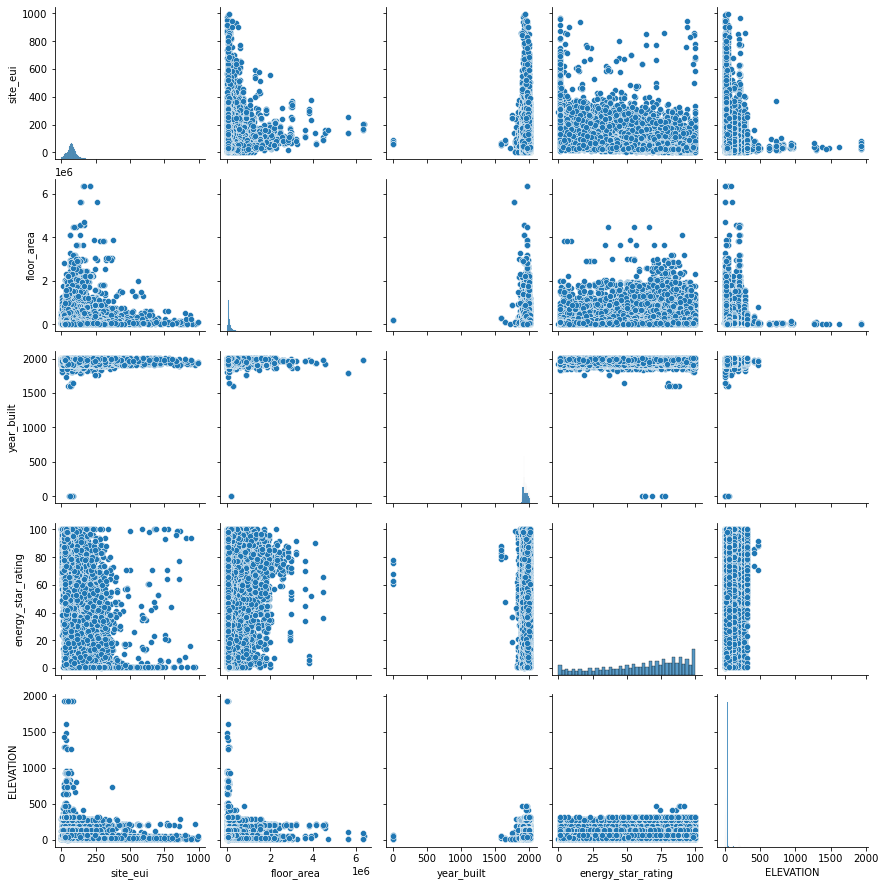

In [145]:
predictorsOfInterest = ['site_eui']+numFeatures[0:4]
sns.pairplot(df[predictorsOfInterest])

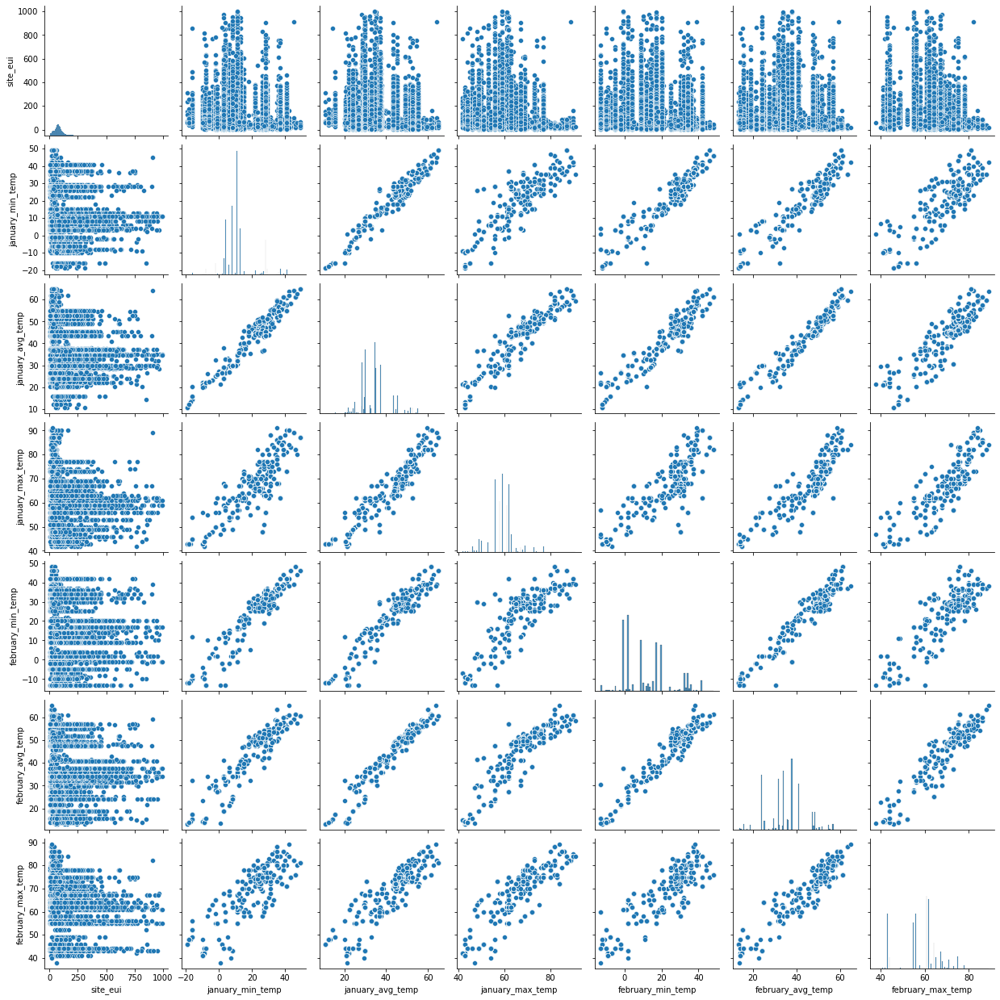

In [157]:
predictorsOfInterest = ['site_eui']+numFeatures[4:10]
sns.pairplot(df[predictorsOfInterest])

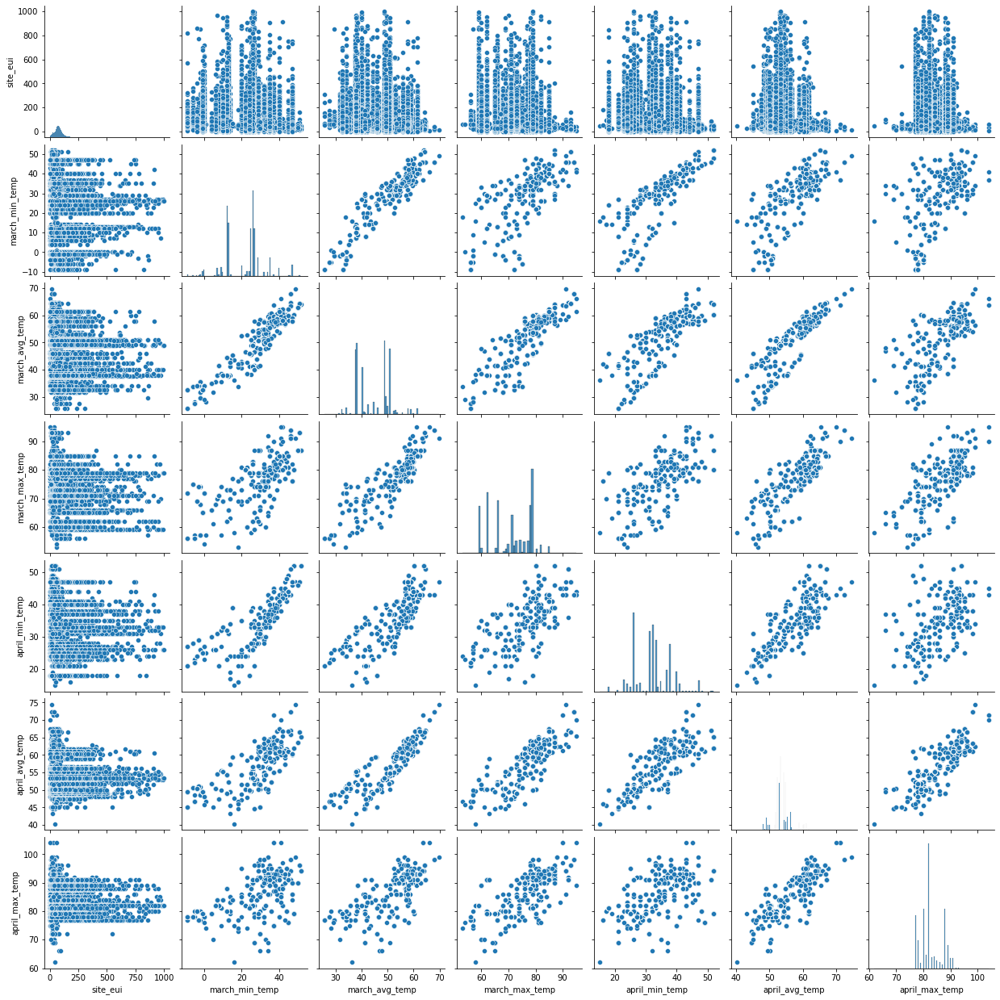

In [158]:
predictorsOfInterest = ['site_eui']+numFeatures[10:16]
sns.pairplot(df[predictorsOfInterest])

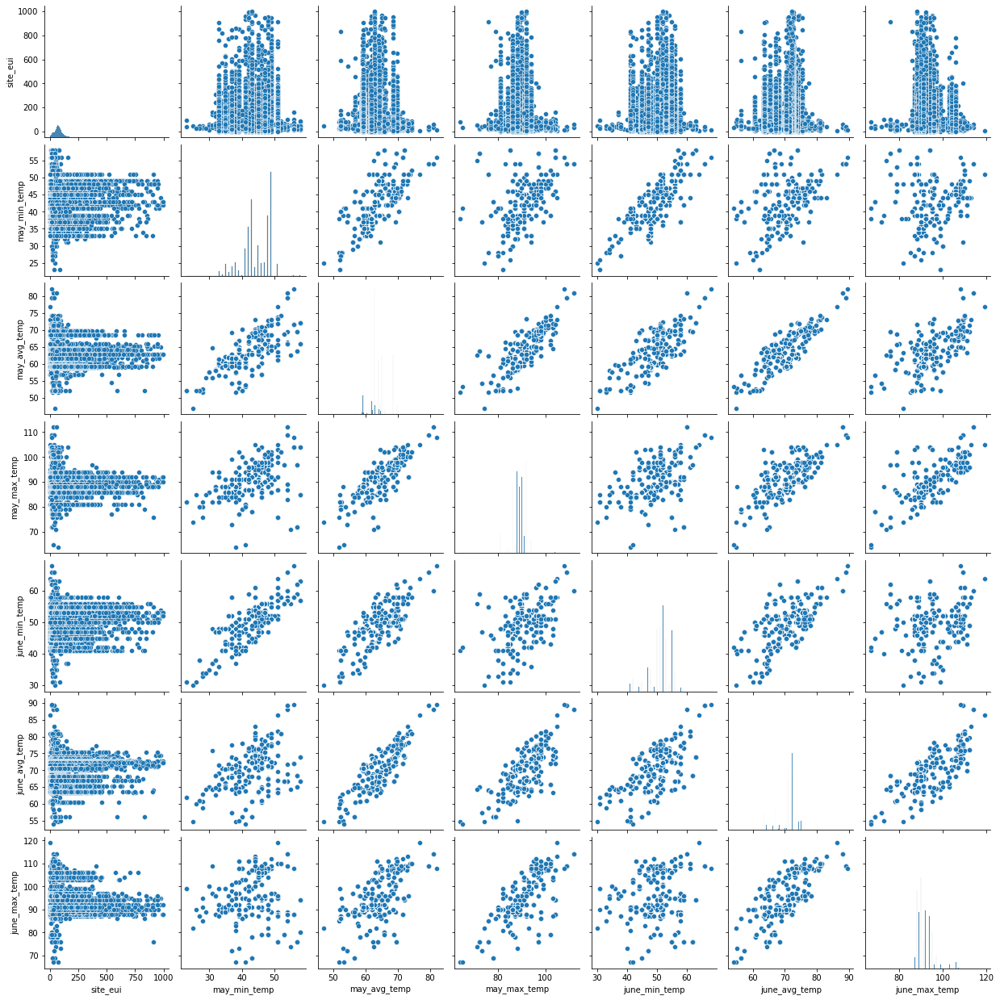

In [159]:
predictorsOfInterest = ['site_eui']+numFeatures[16:22]
sns.pairplot(df[predictorsOfInterest])

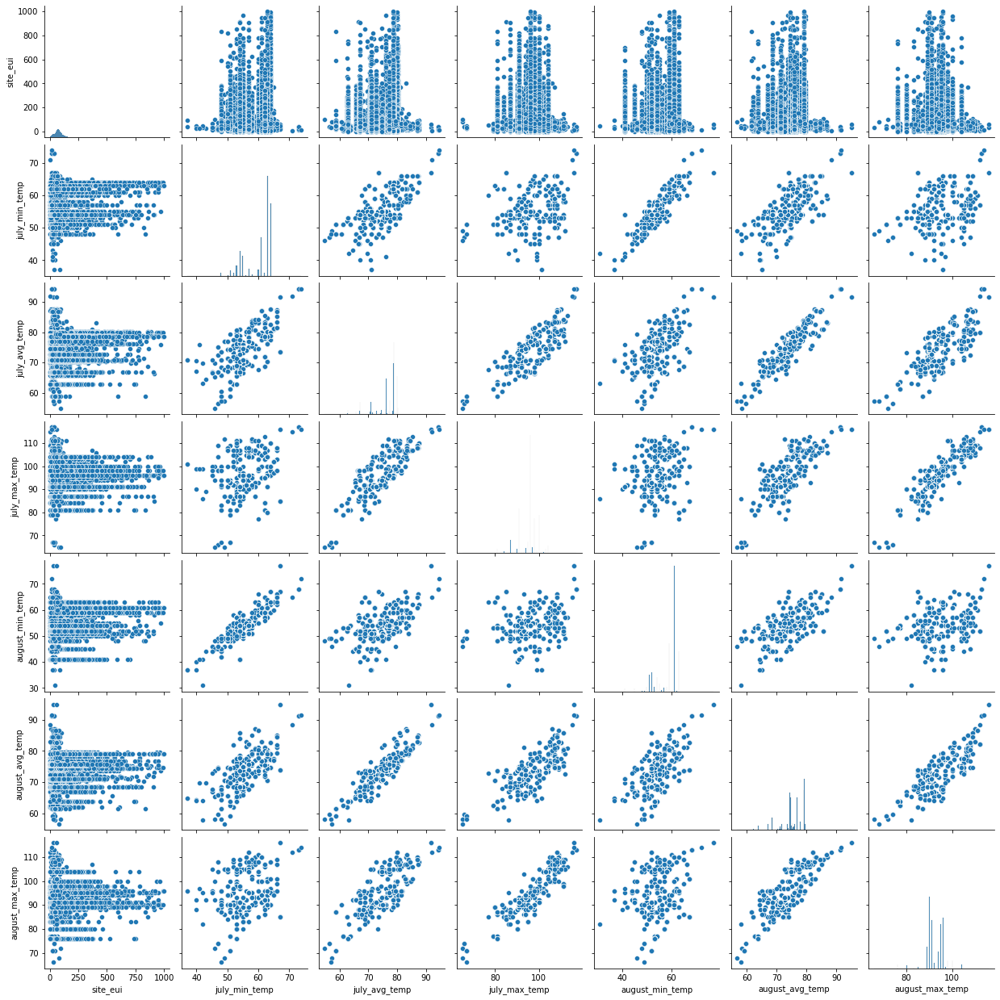

In [160]:
predictorsOfInterest = ['site_eui']+numFeatures[22:28]
sns.pairplot(df[predictorsOfInterest])

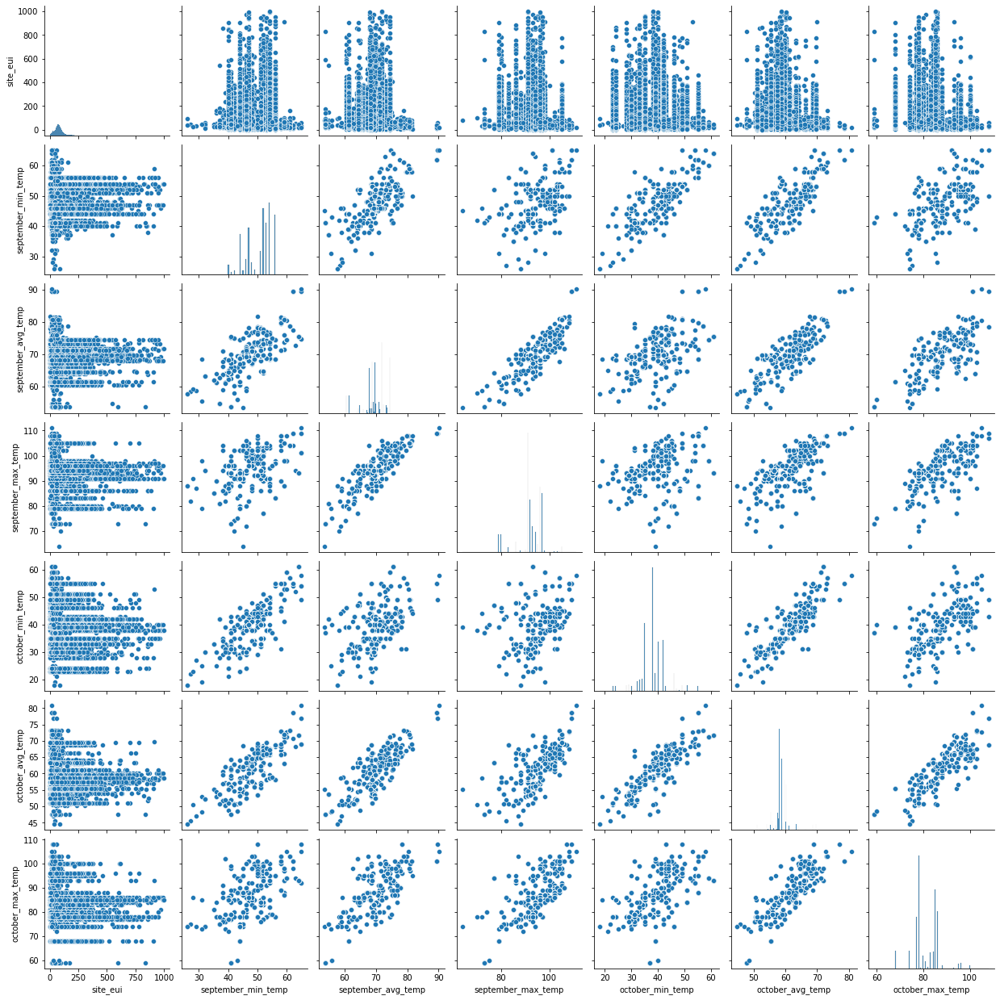

In [161]:
predictorsOfInterest = ['site_eui']+numFeatures[28:34]
sns.pairplot(df[predictorsOfInterest])

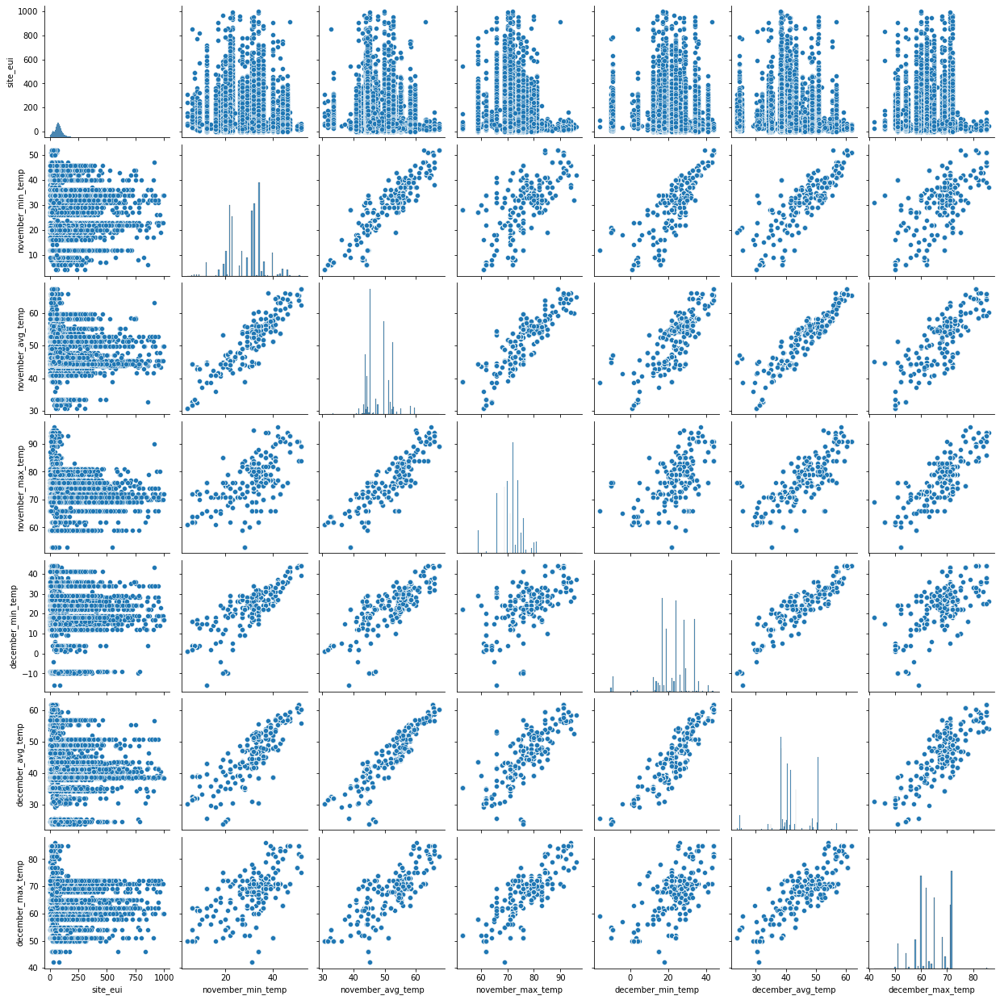

In [162]:
predictorsOfInterest = ['site_eui']+numFeatures[34:40]
sns.pairplot(df[predictorsOfInterest])

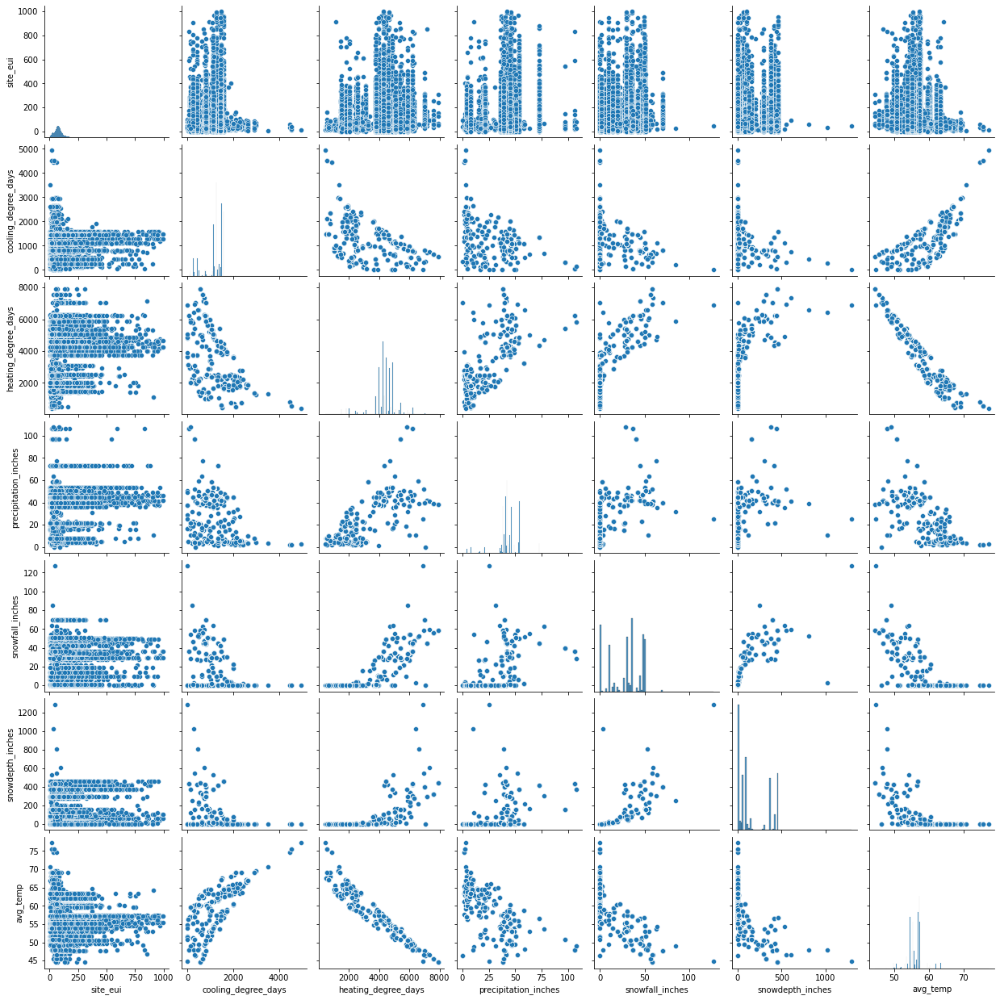

In [163]:
predictorsOfInterest = ['site_eui']+numFeatures[40:46]
sns.pairplot(df[predictorsOfInterest])

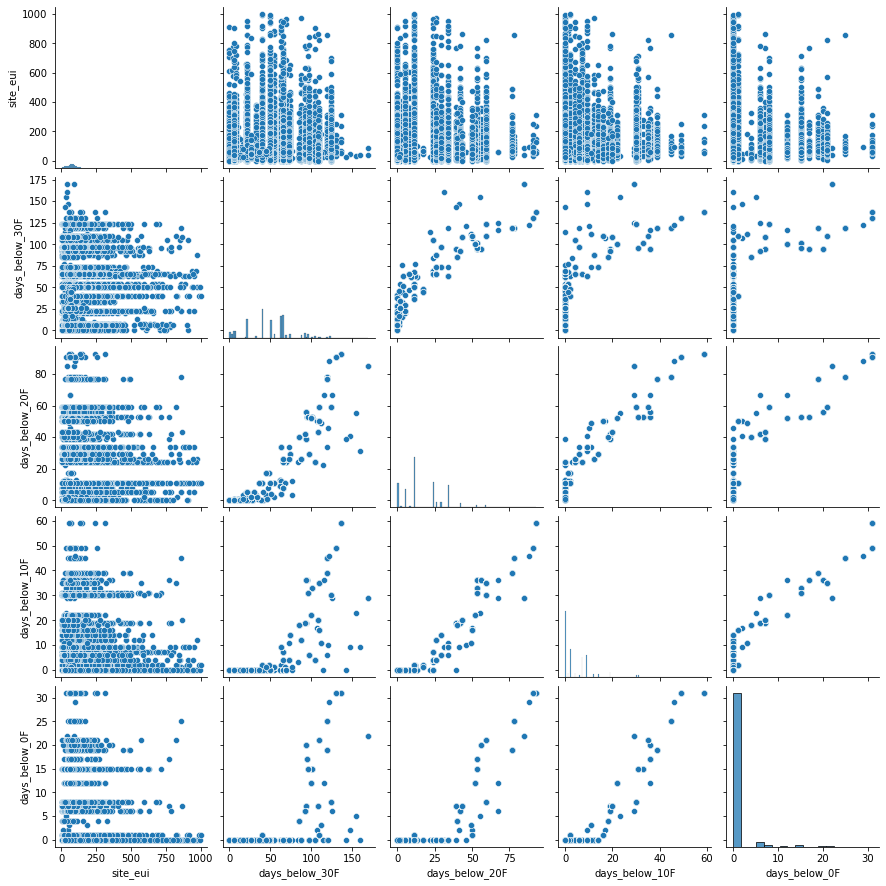

In [165]:
predictorsOfInterest = ['site_eui']+numFeatures[46:50]
sns.pairplot(df[predictorsOfInterest])

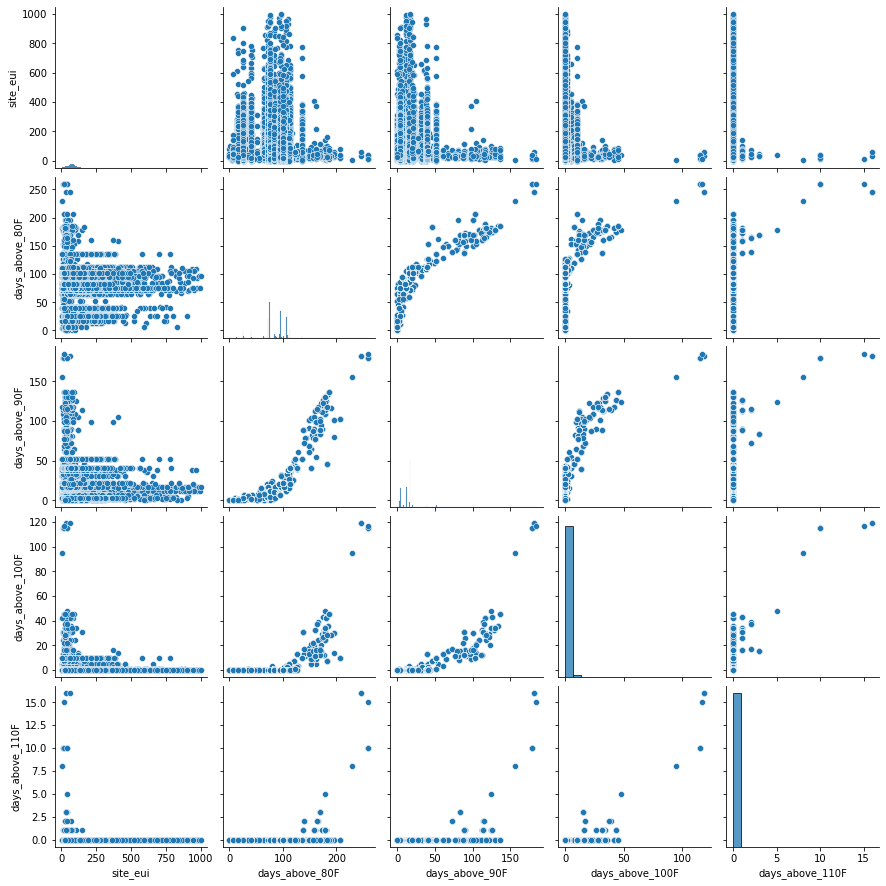

In [166]:
predictorsOfInterest = ['site_eui']+numFeatures[50:54]
sns.pairplot(df[predictorsOfInterest])

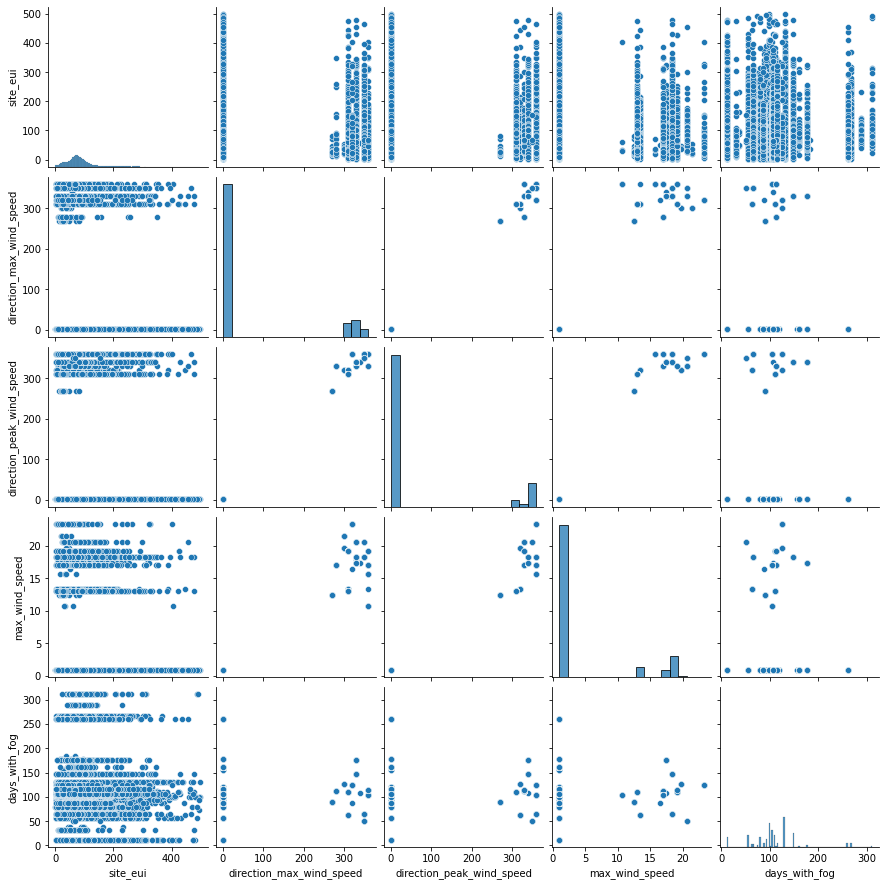

In [226]:
predictorsOfInterest = ['site_eui']+numFeatures[54:58]
sns.pairplot(df[predictorsOfInterest])

### Main Findings

This confirms the findings from the previous heatplots, in that:

* **High Collinearity for Min, Avg and Max Temperature for each month**

* **High Collinearity for snowfall_inches and snowdepth_inches**

* **High Collinearity for direction_max_wind_speed, direction_peak_wind_speed and max_Wind_speed,**

## 2.3 Categorical Columns

In this section, we shall investigate the categorial columns by deriving its summary statistics and plot various graphs to discover patterns and insights.


In [186]:
cat_columns = list(df.select_dtypes(exclude=[np.number]).columns)

In [187]:
df[cat_columns].describe()

,State_Factor,building_class,facility_type
count,75757,75757,75757
unique,7,2,60
top,State_6,Residential,Multifamily_Uncategorized
freq,50840,43558,39455


For State_Factor, there are 7 unique values

For building_class, there are 2 unique values

For facility_type, there are 60 unique values

### Distribution of the Categorical Columns

In this section, we explore the distribution of the data within each categorical column.

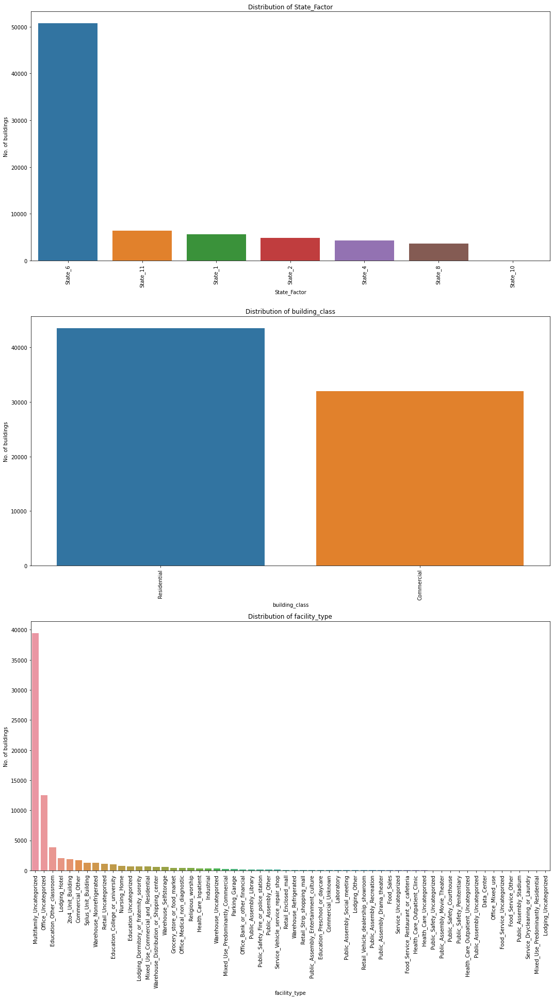

In [227]:
plt.figure(figsize=(15, 27))
# Plot distribution 
for i, col in enumerate(cat_columns):    
    order = df[col].value_counts().index   
    plt.subplot(3,1,i+1); sns.countplot(df[col], order = order ) 
    plt.title(f'Distribution of {col}')
    plt.ylabel('No. of buildings')
    plt.xticks(rotation=90)
# Show the plot
plt.tight_layout()
plt.show()

### Main Findings

From these distribution plots, the following observations are made:

* **A disproportionately large number of buildings are found in State_6. This, however, should not skew our data and this should also mean we can drop this column in our prediction model.**
    * As our predictive model will utilize building characterisitcs and weather data, the location of the state has little significance since its impact is already conveyed through the weather data 
    
    
* **The number of buidlings for residential and commerical buildings are not too dissimilar.**
    * This gives a good variance to our data and our findings for each class should be useful when applying to the Singapore context
    
    
* **A disproportionately large number of buildings are of the facility type, 'Multifamily_Uncategorized' and 'Office_Uncategorized'.**
    * Together, these 2 facility types convers more than 50% of the entire dataset
 

### Distribution - Categorical Columns vs EUI

In this section, we expore the distribution of the site_eui for each of the classes within each categorical column.

<AxesSubplot:xlabel='site_eui', ylabel='Count'>

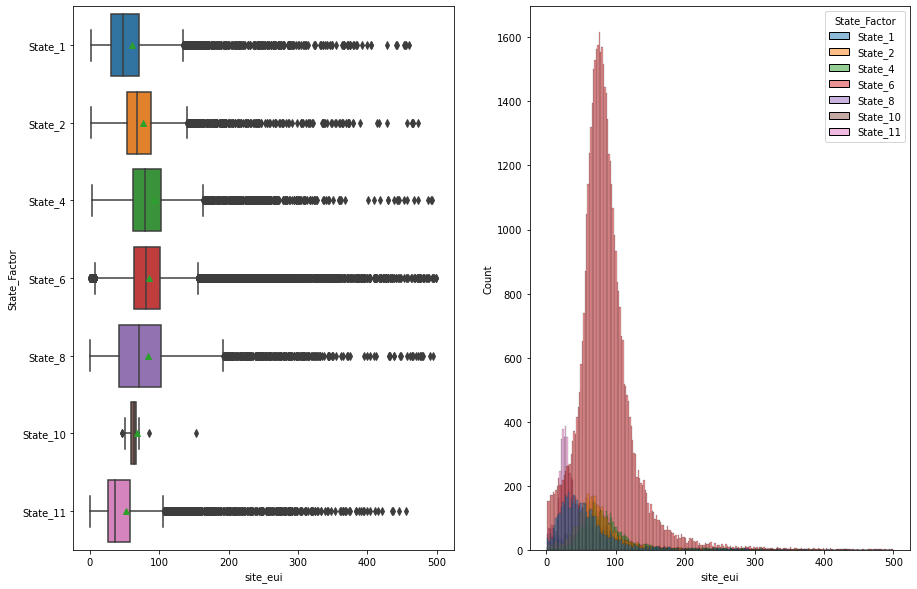

In [229]:
# We plot a boxplot and hist plot for state_factor vs site_eui
plt.figure(figsize=(15,10))  
plt.subplot(1,2,1)
sns.boxplot(x = 'site_eui', y='State_Factor', data = df, showmeans = True)

plt.subplot(1,2,2)
sns.histplot(data = df, x = "site_eui",hue='State_Factor')

<AxesSubplot:xlabel='site_eui', ylabel='State_Factor'>

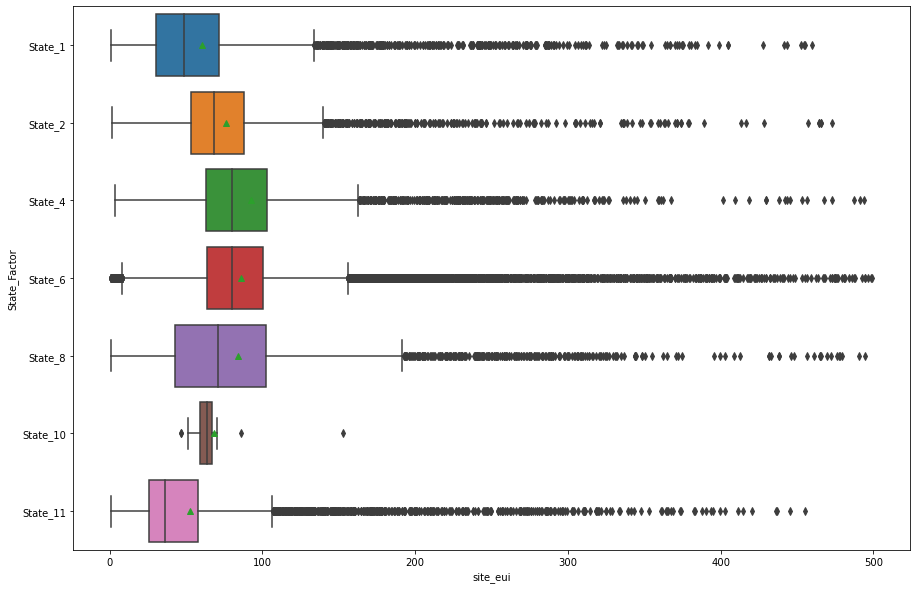

In [228]:
# we plot the boxplot again in a bigger scale for better visualisation
plt.figure(figsize=(15,10)) 
sns.boxplot(x = 'site_eui', y='State_Factor', data = df, showmeans = True)

<AxesSubplot:xlabel='site_eui', ylabel='Count'>

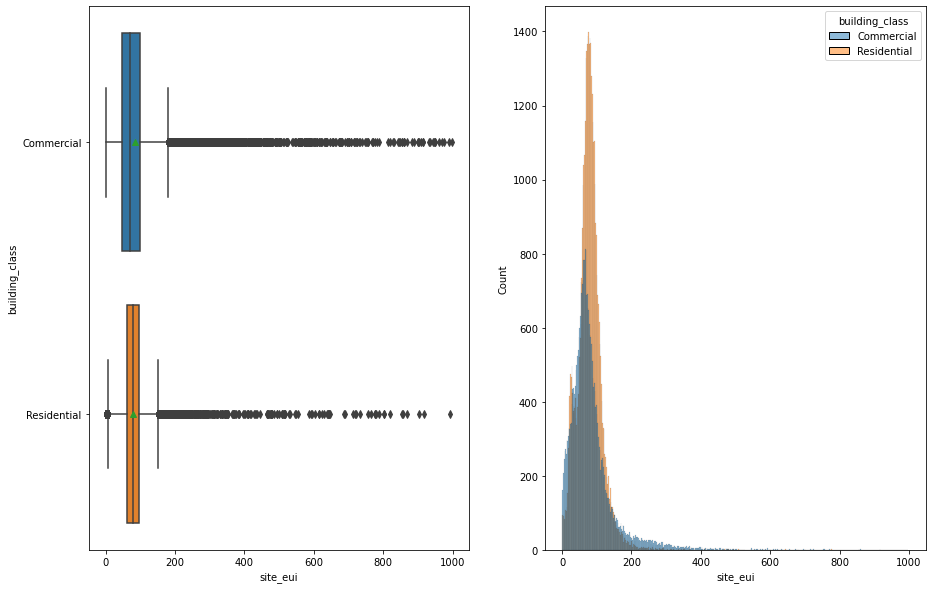

In [137]:
# We plot a boxplot and hist plot for building_class vs site_eui
plt.figure(figsize=(15,10))  
plt.subplot(1,2,1)
sns.boxplot(x = 'site_eui', y='building_class', data = df, showmeans = True)

plt.subplot(1,2,2)
sns.histplot(data = df, x = "site_eui",hue='building_class')

<AxesSubplot:xlabel='site_eui', ylabel='building_class'>

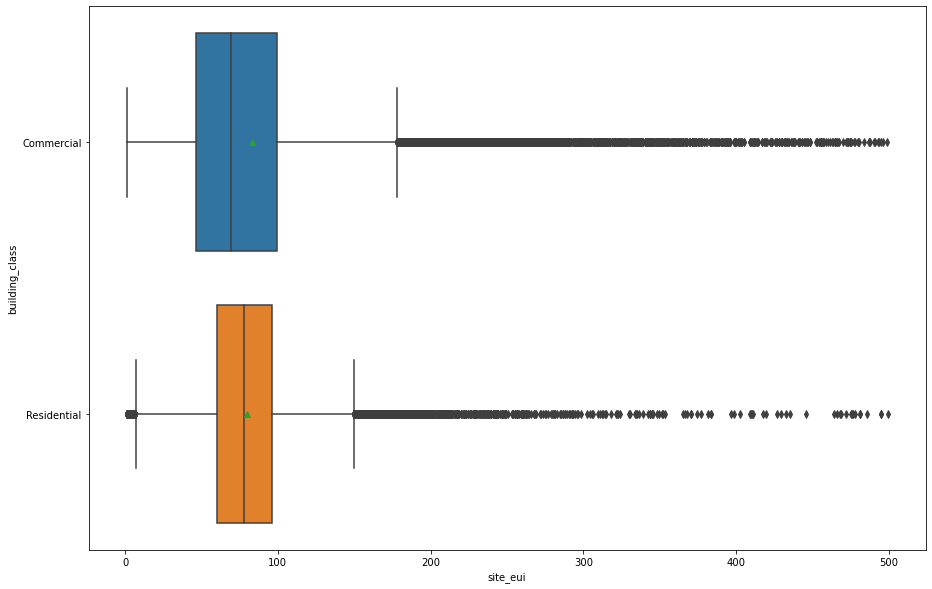

In [230]:
# we plot the boxplot again in a bigger scale for better visualisation
plt.figure(figsize=(15,10))  
sns.boxplot(x = 'site_eui', y='building_class', data = df, showmeans = True)

In [231]:
avg_comm_eui = round(df[df['building_class']=='Commercial']['site_eui'].mean(),2)
med_comm_eui = round(df[df['building_class']=='Commercial']['site_eui'].median(),2)
print(f'Commercial building has average EUI at {avg_comm_eui} and median EUI at {med_comm_eui}')

Commercial building has average EUI at 82.78 and median EUI at 69.45


In [232]:
avg_resid_eui = round(df[df['building_class']=='Residential']['site_eui'].mean(),2)
med_resid_eui = round(df[df['building_class']=='Residential']['site_eui'].median(),2)
print(f'Residential building has average EUI at {avg_resid_eui} and median EUI at {med_resid_eui}')

Residential building has average EUI at 79.6 and median EUI at 77.99


<AxesSubplot:xlabel='site_eui', ylabel='facility_type'>

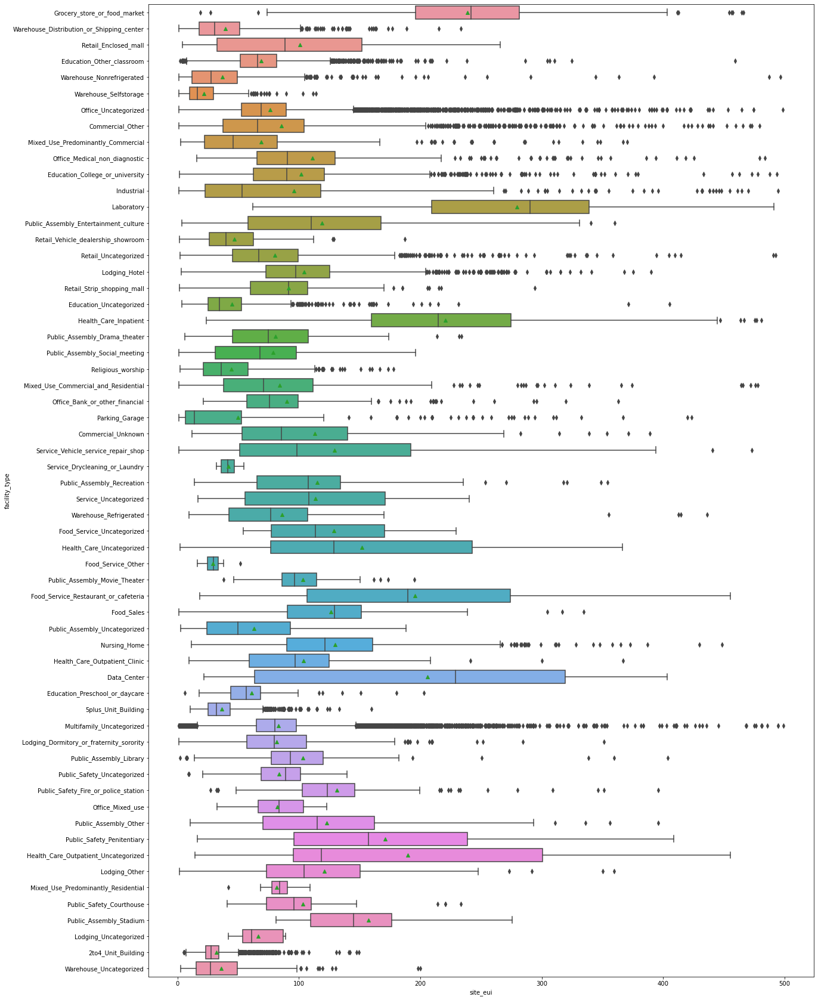

In [233]:
plt.figure(figsize=(20,30))   
sns.boxplot(x = 'site_eui', y='facility_type', data = df, showmeans = True)

### Main Findings

From these distribution plots, the following observations are made:

* **The distribution of the EUI between the various states are very similar, which follows the normal distribution. Furthermore, there is a noticeable difference in the median.**
    * A factor in the difference in the median could be the small differences in weather experienced at each of the states
    * Another factor could be the difference in the progressiveness towards a more green economy and/or climate change between the different states. For example, State 1 (which has the lowest median EUI), may have put in place policies and measures to encourage building owners to reduce the carbon emission.
    
* **The average EUI if the building is residential (79.6) and the average EUI if the building is commercial (82.78) are similar. However, the median EUI if the building is residential (77.99) and the median EUI if the building is commercial (69.45) differs more.**
    * This implies that the distribution skews more left for commercial buildings compared to residential buildings, which is also confirmed by the boxplot
    * This could be because there are likely to be more commercial buidlings that invest in better technology to be more energy efficient, as compared to residential buidlings. 
    
    
* **Amongst the facilities types, Data Centers and Laboratory have clearly the highest average or median EUI.** 
    * Data Centers, especially, are known to be huge energy hogs, whereby everything from the servers, storage equipment and cooling infrastructures have a large appetite for electricity.
    


### Plot Median EUI per category 

To help us further in our analysis, we shall calculate the median EUI per class within each categorical column and plot them on graphs. In addition, we include the overall median EUI in the plot which serves as a good reference point.

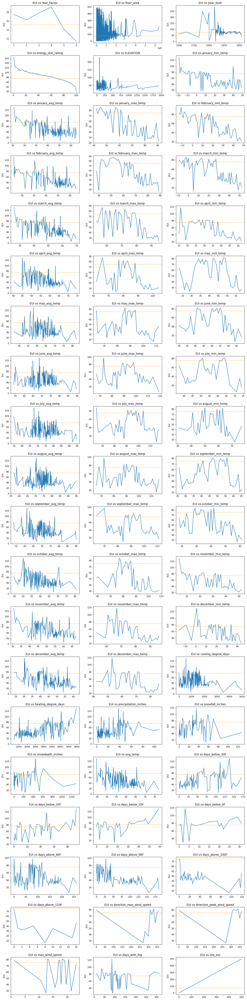

In [234]:
plt.figure(figsize=(15, 66), dpi=80)

for i, col in enumerate(num_columns):
    # Calc conv rate 
    eui = calc_median_EUI(df, [col])
    #print(eui)
    plt.subplot(22,3,i+1);plt.plot(eui.index, eui);plt.ylabel('EUI') 
    plt.title(f'EUI vs {col}')
    # plot the mean 
    plt.axhline(y=overall_median_EUI, color='orange', linestyle='--', alpha=0.7)
# Show the plot
plt.tight_layout()
plt.show()

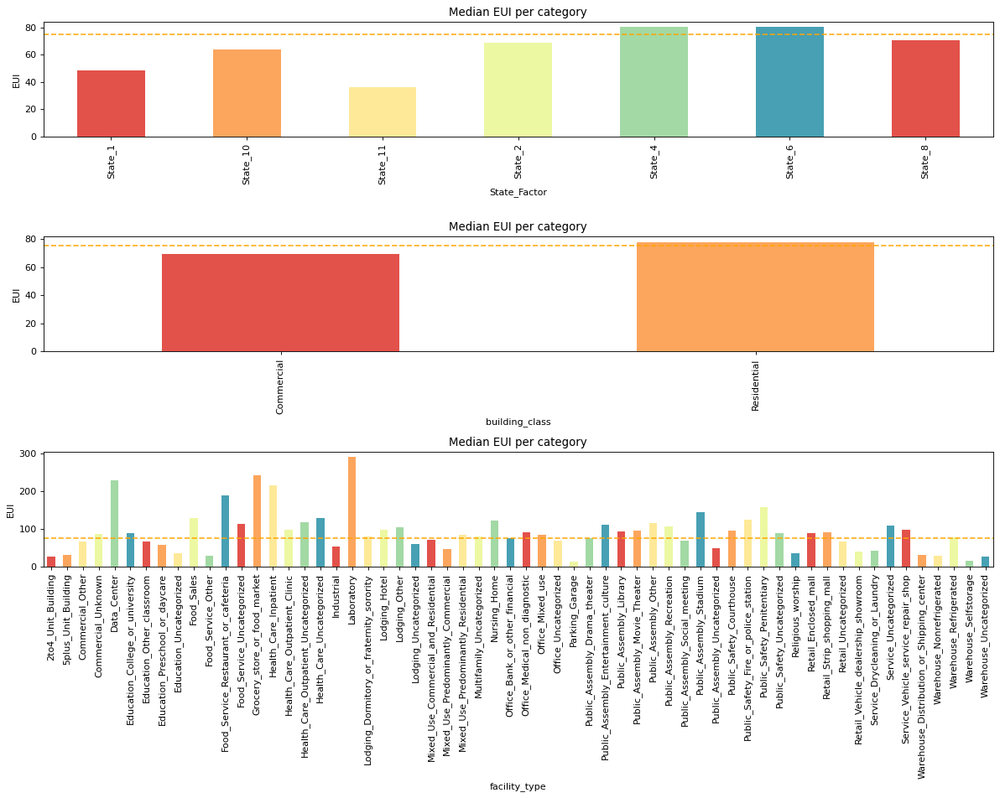

In [235]:
plt.figure(figsize=(15, 12), dpi=80)
for i, col in enumerate(cat_columns):   
    # Calc conv rate 
    eui = calc_median_EUI(df, [col])   
    # Plot distribution 
    plt.subplot(3,1,i+1);eui.plot(kind='bar', color=sns.color_palette("Spectral"));plt.ylabel('EUI') 
    plt.title('Median EUI per category')
    # plot the mean 
    plt.axhline(y=overall_median_EUI, color='orange', linestyle='--', alpha=0.9)
# Show the plot
plt.tight_layout()
plt.show()

### Main Findings

From these distribution plots, the following observations are made:

* **In regards to 'State_Factor', State_1, State_10, State_11, State_2 and State_8 buildings have a median EUI that scores better than the overall median, whereas State_4, State_6 and state_8 buildings have a median EUI that scores better worse than the overall median.**
    * State_11 is the best performing (lowest median), and State_4 is the worst performing (highest median).
    

* **In regards to building_class, commercial buildings have a median EUI that scores slightly worse than the overall median, and the residential buildings have a median EUI that scores slightly better than the overall median.** 
    * This makes sense as we would expect commercial bildings to use more energy consumption per square footage than residential buildings. This is because commercial buildings, such as office or shopping centers etc., are more liklely to run air-conditioning throughout the day/office hours.
    

* **In regards to the facility_type, it seems that the EUI scores tend to be worse for commericial buildings that are more likely to operate 24/7.**
    * For example, data centers, laboratories and health care inpatient (which we stipulate to be clinicsn hospitals etc.) need to be operating 24/7. Furthermore, they use energy-intensive equipment.
    
    


## 2.4 Major Takeways

Listed below are our major takeaways from our EDA done. This will guide us in our next section, whereby we perform feature engineering. 

In addition, we checked the features in the test dataset, as well as the classes within each categorical column, to check if there are any misalignment. 

1. **year_factor**
    * The 'year_factor' is the anonymized year in which the weather and energy usage factors were observed. This column is not really useful in our final model considering that its influence on the EUI should already be translated through the other columns that depict the weather data.
    
    
2. **id**
    * This just represents the identification number of the builings and is not a useful feature


3. **year_built**
    * There is a small percentage of Null values (2.42%)
        * Since this value is small, we will drop these datapoints
    * There is less fluctuation observed in the EUI for the buildings that were built after 1900. There is much greater fluctuation observed in the EUI for the builings that were built before 1900. There is no strong correlation between 
    * We can consider transforming this column into a feature called 'age' that represents the of the building
    * We can also consider transforming this column into a categorical feature
        * Since the 25th percentile is 1927, 50th percentile is 1951, and the 75th percentile is 1977, there is a good variance in the buildings' age and we can categorise the buildings by how old they are. For example, we can label buildings built after 1977 to be 'New' and builings built before 1927 to be 'Old'. 
  
  
4. **building_class**
    * For this feature, the buildings are classified into either 'Commercial' or 'Residential'. We can consider further dividing the 'Commercial' buildings into 2 groups, whereby 1 group represent commercial builings that operate 24/7, and the other group represent commercial buildings that do not operate 24/7. 
    
    
5. **facility_type**
    * For this feature, there are 60 unique values. We can contemplate streamlining the number of unique values as some of the facilities are similar to one another and thus we can consider grouping them together into the same category. 
    * ~52% of the datapoints belong to 1 cateogry, which is 'Multifamily_Uncategorized', while most of the other categories represent less than 1% of the datapoints each.
        * This may not be good for our final prediction model as the distribution of the datapoints means that ......
        * Drop categorical columns whereby their subcategories show a similar distribution of EUI values
            * There is little distinction between the sub categories of the feature and will not help our regression model
        * Drop categorical columns whereby one of the subcategories contain >= 90% of the points
            * Feaures that display this characterisitc display little variance and will not help our regression model
    

6. **Min, Avg, Max Temperatures for each month**
    * For these features, they have high correlations with each other.
    * We will look to drop the Min and Max temperatures for each month to reduce collinearity.
    

7. **snowfall_inches & snowdepth_inches**
    * For these features, they have high correlations with each other.
    * We will look to drop snowdepth_inches to reduce collinearity. We keep snowfall_inches as it has a stronger correlation with site_eui
    
    
8. **direction_peak_wind_speed, max_wind_speed, direction_max_wind_speed**
    * For these features, they have high correlations with each other
    * There are a high percentage of Null values too (55.19%, 54.23% and 54.23% respectively)
    * We will keep max_wind_speed and drop direction_peak_wind_speed & direction_max_wind_speed
        * We feel that this makes the most sense as direction does not seem like a useful characteristic
        * We will replace the Null values with its overall mean
        
        
9. **days_with_fog** 
    * There is a high percentage of Null values (60.45%)
    * We will still look to keep this column as from our earlier EDA, it is 1 of only 5 features that had a negative correlation with site_eui
        * We will replace the Null values with its overall mean.


10. **energy_star_rating**
    * There is a high percentage of Null values (35.26%)
    * We keep this as it has the strongest correlation with site_eui
        * We will replace the Null values with its overall mean.


11. **State_Factor**
    * In the test dataset, there are no datapoints that reside in State_6. In the train dataset, the majority of datapoints reside in State_6
    * We will drop this column as its influence on the EUI should already be translated through the other columns that depict the weather data.
    


In [699]:
train = df

In [700]:
# this checks for Null values
test.isnull().sum().sort_values(ascending=False)

days_with_fog                9117
max_wind_speed               8575
direction_peak_wind_speed    8575
direction_max_wind_speed     8575
energy_star_rating           2254
year_built                     92
Year_Factor                     0
november_max_temp               0
cooling_degree_days             0
december_max_temp               0
december_avg_temp               0
december_min_temp               0
october_avg_temp                0
november_avg_temp               0
november_min_temp               0
october_max_temp                0
precipitation_inches            0
october_min_temp                0
heating_degree_days             0
avg_temp                        0
snowfall_inches                 0
snowdepth_inches                0
september_avg_temp              0
days_below_30F                  0
days_below_20F                  0
days_below_10F                  0
days_below_0F                   0
days_above_80F                  0
days_above_90F                  0
days_above_100

In [635]:
# this displays the percentage of Null values
round(test.isnull().sum()*100/len(df),2).sort_values(ascending=False)[:7]

days_with_fog                12.07
max_wind_speed               11.35
direction_peak_wind_speed    11.35
direction_max_wind_speed     11.35
energy_star_rating            2.98
year_built                    0.12
Year_Factor                   0.00
dtype: float64

In [636]:
def check_for_misalignment(train, test):
    missing_features = []
    for i in train.columns:
        if i not in test.columns:
            missing_features.append(i)
    for j in test.columns:
        if j not in train.columns:
            missing_features.append(j)
    return missing_features

In [637]:
check_for_misalignment(train,test)
# site_eui is not present in the test dataset as that is what we are trying to predict
# id we dropped id earlier during our EDA, and we will do the same for the test dataset.

['site_eui', 'id']

In [638]:
cat_columns

['State_Factor', 'building_class', 'facility_type']

In [644]:
missing_classes = []
for i in train['facility_type'].unique():
    if i not in test['facility_type'].unique():
        missing_classes.append(i)
for i in test['facility_type'].unique():
    if i not in train['facility_type'].unique():
        missing_classes.append(i)
missing_classes
# for facility_type, there is no unique values that are do not appear in one set but not the other

[]

In [645]:
missing_classes = []
for i in train['building_class'].unique():
    if i not in test['building_class'].unique():
        missing_classes.append(i)
for i in test['building_class'].unique():
    if i not in train['building_class'].unique():
        missing_classes.append(i)
missing_classes
# for building_class, there is no unique values that are do not appear in one set but not the other

[]

In [641]:
missing_classes = []
for i in train['State_Factor'].unique():
    if i not in test['State_Factor'].unique():
        missing_classes.append(i)
for i in test['State_Factor'].unique():
    if i not in train['State_Factor'].unique():
        missing_classes.append(i)
missing_classes

['State_6']

In [642]:
test['State_Factor'].value_counts()

State_11    3268
State_4     2568
State_2     1515
State_8     1323
State_1     1027
State_10       4
Name: State_Factor, dtype: int64

In [643]:
train['State_Factor'].value_counts()
# state 6 appears in the train dataset but not in the test dataset

State_6     50711
State_11     6395
State_1      5598
State_2      4859
State_4      4281
State_8      3683
State_10       15
Name: State_Factor, dtype: int64

## <a name="sec_3"></a>Section 3: Feature Engineering

In this section, we will perform feature engineering to prepare the dataset for modeling. We will have to apply the same steps to the test dataset as well.

Listed in the table below is the summary of the feature engineering that is done for identified columns.

|s/n|Feature|Feature Engineering done|Remarks|
|---|---|---|---|
|1|Year_Factor|Drop|Test dataset is from a different Year_Factor, weather fluctuates between the different years but its effects on the EUI are translated through the weather data|
|2|id|Drop|Not useful, id is just the identification number of the building|
|3|Min temperature for each month|Drop|To reduce multicollinearity|
|4|Max temperature for each month|Drop|To reduce multicollinearity|
|5|snowdepth_inches|Drop|To reduce multicollinearity|
|6|direction_peak_wind_speed|Drop|To reduce multicollinearity|
|7|direction_max_wind_speed|Drop|To reduce multicollinearity|
|8|max_wind_speed|Replace Null values with its overall mean|54.23% are Null values, keep a feature that is related to wind|
|9|days_with_fog|Replace Null values with its overall mean|60.45% are Null values, 1 of only 5 features with a negative correlation with EUI|
|10|energy_star_rating|Replace Null values with its overall mean|35.26% are Null values, feature has a strong correlation with EUI|
|11|State_Factor|Drop|No datapoints in the test dataset reside in State_6, ~50% of datapoints in train dataset reside in State 6|
|12|year_built|Convert this into a categorical feature, with classes 'New', 'Average' and 'Old'. Delete datapoints with Null values|Numerical feature has a weak correlation. Good spread of data with these classes. 2.42% are Null values|
|13|building_class|Divide 'commercial' buidlings to commercial_non_24_7 & commercial_24_7|commerical builings that operate 24/7 uses more energy, hence it scores a higher EUI|

#### Year_Factor

Drop this column as, test dataset is from a different Year_Factor. Weather fluctuates between the different years but its effects on the EUI are translated through the weather data.

In [701]:
train.drop('Year_Factor', inplace = True, axis = 1)
test.drop('Year_Factor', inplace = True, axis = 1)

#### id
We already dropped this column during our EDA

In [702]:
test.drop('id', inplace = True, axis = 1)

#### Min temperature for each month

Drop this column as it has high correlations with Avg temperature and Max temperature and we want to reduce multicollinearity

In [703]:
train.drop(['january_min_temp', 'february_min_temp','march_min_temp', 'april_min_temp',
           'may_min_temp', 'june_min_temp','july_min_temp', 'august_min_temp', 'september_min_temp',
            'october_min_temp','november_min_temp', 'december_min_temp'], inplace = True, axis = 1)

test.drop(['january_min_temp', 'february_min_temp','march_min_temp', 'april_min_temp',
           'may_min_temp', 'june_min_temp','july_min_temp', 'august_min_temp', 'september_min_temp',
            'october_min_temp','november_min_temp', 'december_min_temp'], inplace = True, axis = 1)

#### Max temperature for each month

Drop this column as it has high correlations with Avg temperature and Min temperature and we want to reduce multicollinearity

In [704]:
train.drop(['january_max_temp', 'february_max_temp','march_max_temp', 'april_max_temp',
           'may_max_temp', 'june_max_temp','july_max_temp', 'august_max_temp', 'september_max_temp', 
            'october_max_temp', 'november_max_temp', 'december_max_temp'], inplace = True, axis = 1)

test.drop(['january_max_temp', 'february_max_temp','march_max_temp', 'april_max_temp',
           'may_max_temp', 'june_max_temp','july_max_temp', 'august_max_temp', 'september_max_temp', 
            'october_max_temp', 'november_max_temp', 'december_max_temp'], inplace = True, axis = 1)

#### snowdepth_inches

Drop this column as it has high correlations with snowfall_inches and we want to reduce multicollinearity.
We keep snowfall_inches as it has a stronger correlation with site_eui.

In [705]:
train.drop('snowdepth_inches', inplace = True, axis = 1)
test.drop('snowdepth_inches', inplace = True, axis = 1)

#### direction_peak_wind_speed

Drop this column as it has high correlations with direction_max_wind_speed and max_wind_speed and we want to reduce multicollinearity.
We keep max_wind_speed as direction does not appear to be a useful characteristic

In [706]:
train.drop('direction_peak_wind_speed', inplace = True, axis = 1)
test.drop('direction_peak_wind_speed', inplace = True, axis = 1)

#### direction_max_wind_speed

Drop this column as it has high correlations with direction_peak_wind_speed and max_wind_speed and we want to reduce multicollinearity.
We keep max_wind_speed as direction does not appear to be a useful characteristic

In [707]:
train.drop('direction_max_wind_speed', inplace = True, axis = 1)
test.drop('direction_max_wind_speed', inplace = True, axis = 1)

#### max_wind_speed

54.23% are Null values. We replace Null values with its overall mean. Though the percentage of Null values is high, we want to keep a feature that is related to wind

We keep max_wind_speed instead of direction_peak_wind_speed and direction_max_wind_speed

In [708]:
train['max_wind_speed'] = train['max_wind_speed'].fillna(train['max_wind_speed'].mean())
test['max_wind_speed'] = test['max_wind_speed'].fillna(test['max_wind_speed'].mean())

#### days with fog

60.45% are Null values. We replace Null values with its overall mean.

As days_with_fog is 1 of only 5 features with negative correlaton with EUI, we want to keep this feature.

In [709]:
train['days_with_fog'] = train['days_with_fog'].fillna(train['days_with_fog'].mean())
test['days_with_fog'] = test['days_with_fog'].fillna(test['days_with_fog'].mean())

#### energy_star_rating

35.26% are Null values. We replace Null values with its overall mean.

As energy_star_rating has the strongest correlaton with EUI, we want to keep this feature. In addition, the Null values seen is likley due to the fact that the building owners had not gone through the process of attaining the energy_star_rating, and thus having Null values is not indicative of the building's energy performance. Furthermore, a quick look at the EUI summary statistics for the datapoints that have Null values for energy_star_rating shows that the mean and median are similar to the rest of the datapoints.

In [710]:
train.loc[train['energy_star_rating'].isnull(),:]['site_eui'].describe()

count    26611.000000
mean        83.445043
std         54.432567
min          1.001169
25%         54.674427
50%         76.782620
75%         99.600000
max        499.136898
Name: site_eui, dtype: float64

In [711]:
train['energy_star_rating'] = train['energy_star_rating'].fillna(train['energy_star_rating'].mean())
test['energy_star_rating'] = test['energy_star_rating'].fillna(test['energy_star_rating'].mean())

#### State_Factor

Drop this column, as ~50% of datapoints in train dataset reside in State 6, but no datapoints in the test dataset reside in State 6. Moreover, weather fluctuates between the different states/locations but its effects on the EUI are translated through the weather data.

In [712]:
train.drop('State_Factor', inplace = True, axis = 1)
test.drop('State_Factor', inplace = True, axis = 1)

#### building_class

Under building_class, there are 2 unique values, which are 'Residential' and 'Commercial'.

We divide 'Commercial' buidlings to 'Commercial_non_24_7' & 'Commercial_24_7' This is because commerical builings that operate 24/7 uses more energy and thus are morely to score a higher EUI. We want to capture this relationship in our prediction model.

In [713]:
def building_class(df):
    if (df['building_class'] == 'Residential'):
        return 'Residential'
    elif (df['facility_type'] in ('Data_Center', 'Laboratory', 'Grocery_store_or_food_market', 
                                 'Health_Care_Inpatient', 'Health_Care_Uncategorized', 
                                 'Health_Care_Outpatient_Uncategorized')):
        return 'Commercial_24_7'
    else:
        return 'Commercial_non_24_7'

In [714]:
train['building_class'] = train.apply(building_class, axis = 1)

In [715]:
test['building_class'] = test.apply(building_class, axis=1)

#### year_built

To recap what we had found in our earlier EDA, listed below are our main observations in regards to this feature.
* 2.42% have Null values
* The minimum value observed is 0, which is highly unlikely and seems to be an error. we have already removed this in during the earlier EDA
* From the descriptive statistics and distirubtuion plots between the year_built and site_eui, there does not seem to be a strong or distinctive relationship between these 2 variables.


Let us dive deeper and create a new feature titled 'age' which describes the age of the house. Since the year_factor is anonymized, we shall work with the assumption that the age of the house is relative to baseline year 2022. In addition, we will remove the datapoints that are Null values and 0.

Our hypothesis is that the older the builings, the more likely that the site_eui will be numerically higher (less energy efficient). This is because they are less likely to be retro-fitted with more technologically advanced energy saving equipment.


In [716]:
# we write a function to calculate the age of building, relative to baseline year 2022
def age_of_building(df):
    age = 2022 - df['year_built']
    return age

In [717]:
# we create a new dataset that removes the datapoints that are Null values
check_age_effects = train.loc[train['year_built'].notnull(),:]

In [718]:
# we create a new column in the dataset that desribes the age of the building
warnings.filterwarnings("ignore")
check_age_effects['age'] = check_age_effects.apply(age_of_building, axis=1)

In [719]:
# we calculate the correlation between age of building and its eui
check_age_effects[['age','site_eui']].corr()['site_eui']

age        -0.016408
site_eui    1.000000
Name: site_eui, dtype: float64

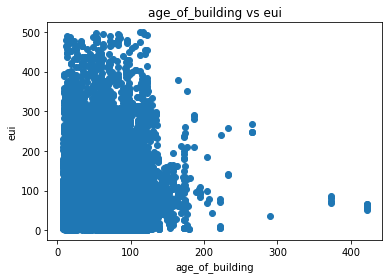

In [720]:
# we plot these 2 variables on a scatter plot to check its distribution
plt.scatter(check_age_effects['age'], check_age_effects['site_eui'], marker='o');
plt.title(f'age_of_building vs eui')
plt.xlabel('age_of_building')
plt.ylabel('eui');

Text(0.5, 0, 'age_of_building')

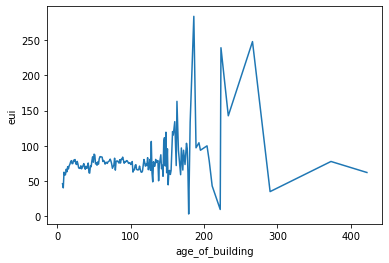

In [721]:
# We calculate the mean eui for each age and plot it on a graph
eui = calc_median_EUI(check_age_effects, 'age')
plt.plot(eui.index,eui)
plt.ylabel('eui')
plt.xlabel('age_of_building')

In [722]:
# We find out the descriptive statistics for age_of_building
check_age_effects['age'].describe()

count    73711.000000
mean        69.553608
std         32.619446
min          7.000000
25%         45.000000
50%         71.000000
75%         95.000000
max        422.000000
Name: age, dtype: float64

#### _Main Findings_

* Based on the absolute value of the correlation coefficient, there does not appear to be a strong relationship between age of buildings and eui
    * The coefficient is just -0.016408
        * Furthermore, a negative coefficient means that as the age of building increases, the eui numerically decreases (less energy consumption/more energy efficient), which goes against our hypothesis.
        * However, this could be misleading as it is also likely that older buildings do not consume as much energy as they may not be used as much
        

* Less than 25% of the buildings are more than 100 years old. 
    * As there are less data points, this would explain the greater fluctuations in the eui for these buildings


* Still, from the plot, for buidlings that are less than 50 years old, we can see a slight increasing trend as age of building increases, and for buildings that are from 50 to 100 yeards old, we can see a straighter line as age of building increases.


#### _Convert year_built column into a Categorical feature_

Following up from our findings, we decided to convert the year_built column into a categorical feature, whereby;

1) <= 50 years old : New

2) 50 < x <= yeards old : Average

3) > 100 years old: Old


Thoough the correlation coeffcient from our EDA did not reveal a strong relationship, we still feel that age of building is an useful characteristc that, when coupled with other characteristics (such as facility type, floor area) will make our prediction model more robust. 

Furthermore, we broke down the age of buildings into different categories so that we may capture the slight increasing trend for buildings less than 50 years old.

In [723]:
def new_average_old(df):
    if (df['year_built'] >= 1972):
        return 'new'
    elif (df['year_built'] < 1922):
        return 'old'
    else:
        return 'average'

In [724]:
# We defince a function that pulls out each variable and the Saleprice into a temp dataframe 
# and returns us correlation of dummies
def cat_feature_corr(df, x, y):
    df_new = df[[x, y]]
    df_new = pd.get_dummies(df_new, columns = [x], drop_first = False)
    return df_new.corr()['site_eui'].T

In [725]:
cat_feature_corr(train, 'year_built', 'site_eui')

site_eui             1.000000
year_built_1600.0   -0.003696
year_built_1649.0   -0.000435
year_built_1732.0   -0.003419
year_built_1756.0    0.025609
year_built_1789.0    0.012738
year_built_1799.0    0.011797
year_built_1800.0   -0.009237
year_built_1811.0   -0.002815
year_built_1815.0   -0.000176
year_built_1818.0    0.004835
year_built_1827.0    0.002171
year_built_1829.0    0.001747
year_built_1833.0    0.001214
year_built_1836.0    0.027742
year_built_1841.0    0.003882
year_built_1843.0   -0.008188
year_built_1844.0   -0.001400
year_built_1845.0    0.009833
year_built_1846.0    0.001689
year_built_1848.0    0.006826
year_built_1850.0    0.005748
year_built_1851.0    0.000650
year_built_1853.0    0.002192
year_built_1854.0    0.003183
year_built_1857.0    0.009325
year_built_1859.0    0.006126
year_built_1860.0   -0.002734
year_built_1862.0    0.003978
year_built_1864.0    0.003726
year_built_1865.0    0.008024
year_built_1867.0   -0.001821
year_built_1868.0   -0.000917
year_built

As seen in the correlations, 'average' buildings have a positive correlation, whereas 'new' and 'old' buildings have a negative correlation, which makes more sense. 

In [726]:
train['year_built'] = train.apply(new_average_old, axis=1)
test['year_built'] = test.apply(new_average_old, axis=1)

From the value of the correlaetion, we see that 'year_built_average' (0.0264) and 'year_built_old' (-0.0340) are the most significant ones. We will replace 'year_built_average' with 1, 'year_built_new' with 0, and 'year_built_old' with -1

#### Get Dummies
For our categorial features, we would need to perform one-hot encoding.

In [727]:
train = pd.get_dummies(train, columns = ['facility_type','building_class','year_built'], drop_first = False)
test = pd.get_dummies(test, columns = ['facility_type','building_class','year_built'], drop_first = False)

## <a name="sec_4"></a>Section 4: Modeling

After cleaning the dataset, we can now proceed to modeling. We will be using the following models
* Linear Regression
* Ridge Regression
* Lasso Regression
* Gradient Boost
* Ada Boost
* Random Forest


The data is split into 80% train and validation set, 20% test set. Apart from Linear Regression, GridSearch CV is applied across folds on the data, to find the best hyperparameters for all the models.

We will be using pipelines and the results can be viewed in the table towards the end of the section.

In [671]:
# Set up X and y variables for our prediction model
X = train[['floor_area', 'ELEVATION', 'january_avg_temp',
       'february_avg_temp', 'march_avg_temp', 'april_avg_temp', 'may_avg_temp',
       'june_avg_temp', 'july_avg_temp', 'august_avg_temp',
       'september_avg_temp', 'october_avg_temp', 'november_avg_temp',
       'december_avg_temp', 'cooling_degree_days', 'heating_degree_days',
       'precipitation_inches', 'snowfall_inches', 'avg_temp', 'days_below_30F',
       'days_below_20F', 'days_below_10F', 'days_below_0F', 'days_above_80F',
       'days_above_90F', 'days_above_100F', 'days_above_110F',
       'max_wind_speed', 'days_with_fog',
       'facility_type_2to4_Unit_Building', 'facility_type_5plus_Unit_Building',
       'facility_type_Commercial_Other', 'facility_type_Commercial_Unknown',
       'facility_type_Data_Center',
       'facility_type_Education_College_or_university',
       'facility_type_Education_Other_classroom',
       'facility_type_Education_Preschool_or_daycare',
       'facility_type_Education_Uncategorized', 'facility_type_Food_Sales',
       'facility_type_Food_Service_Other',
       'facility_type_Food_Service_Restaurant_or_cafeteria',
       'facility_type_Food_Service_Uncategorized',
       'facility_type_Grocery_store_or_food_market',
       'facility_type_Health_Care_Inpatient',
       'facility_type_Health_Care_Outpatient_Clinic',
       'facility_type_Health_Care_Outpatient_Uncategorized',
       'facility_type_Health_Care_Uncategorized', 'facility_type_Industrial',
       'facility_type_Laboratory',
       'facility_type_Lodging_Dormitory_or_fraternity_sorority',
       'facility_type_Lodging_Hotel', 'facility_type_Lodging_Other',
       'facility_type_Lodging_Uncategorized',
       'facility_type_Mixed_Use_Commercial_and_Residential',
       'facility_type_Mixed_Use_Predominantly_Commercial',
       'facility_type_Mixed_Use_Predominantly_Residential',
       'facility_type_Multifamily_Uncategorized', 'facility_type_Nursing_Home',
       'facility_type_Office_Bank_or_other_financial',
       'facility_type_Office_Medical_non_diagnostic',
       'facility_type_Office_Mixed_use', 'facility_type_Office_Uncategorized',
       'facility_type_Parking_Garage',
       'facility_type_Public_Assembly_Drama_theater',
       'facility_type_Public_Assembly_Entertainment_culture',
       'facility_type_Public_Assembly_Library',
       'facility_type_Public_Assembly_Movie_Theater',
       'facility_type_Public_Assembly_Other',
       'facility_type_Public_Assembly_Recreation',
       'facility_type_Public_Assembly_Social_meeting',
       'facility_type_Public_Assembly_Stadium',
       'facility_type_Public_Assembly_Uncategorized',
       'facility_type_Public_Safety_Courthouse',
       'facility_type_Public_Safety_Fire_or_police_station',
       'facility_type_Public_Safety_Penitentiary',
       'facility_type_Public_Safety_Uncategorized',
       'facility_type_Religious_worship', 'facility_type_Retail_Enclosed_mall',
       'facility_type_Retail_Strip_shopping_mall',
       'facility_type_Retail_Uncategorized',
       'facility_type_Retail_Vehicle_dealership_showroom',
       'facility_type_Service_Drycleaning_or_Laundry',
       'facility_type_Service_Uncategorized',
       'facility_type_Service_Vehicle_service_repair_shop',
       'facility_type_Warehouse_Distribution_or_Shipping_center',
       'facility_type_Warehouse_Nonrefrigerated',
       'facility_type_Warehouse_Refrigerated',
       'facility_type_Warehouse_Selfstorage',
       'facility_type_Warehouse_Uncategorized',
       'building_class_Commercial_24_7', 'building_class_Commercial_non_24_7',
       'building_class_Residential', 'year_built_average', 'year_built_new',
       'year_built_old']]
y = train['site_eui']

In [672]:
# Next we do a train test split
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42, test_size = 0.2)

For Ridge Regression, Lasso Regression, Gradient Boost, Ada Boost and Random Forest, we need to scale our data annd peform a fit_transform

In [676]:
ss = StandardScaler()

In [677]:
X_train_scaled = ss.fit_transform(X_train)
X_test_scaled = ss.fit_transform(X_test)

### Baseline Score
We first calculate the baseline score, with which we can reference when evaluating our models

In [673]:
print(f'MSE of baseline model: {mean_squared_error(y_test, [np.mean(y_train)] * len(y_test))}')

MSE of baseline model: 2529.7611186146987


In [674]:
print(f'R^2 of baseline model: {r2_score(y_test, [np.mean(y_train)] * len(y_test))}')

R^2 of baseline model: -0.00034406962225230764


### Linear Regression

In [678]:
lr = LinearRegression()

Train Score: 0.2920481183222008
Test Score: 0.26502760962517746
Cross Validation Score 0.28722882057529775
MSE on training set: 1661.4981659001194
MSE on testing set: 1858.6650662382963


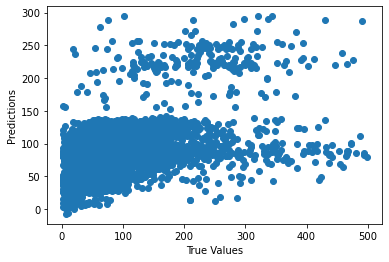

In [679]:
model_lr = lr.fit(X_train, y_train)
predictions = lr.predict(X_test)

## The line/ model
plt.scatter(y_test, predictions)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_lr.score(X_train,y_train))
print("Test Score:", model_lr.score(X_test, y_test))
print("Cross Validation Score", np.mean(cross_val_score(lr, X_train, y_train, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train, model_lr.predict(X_train))}')
print(f'MSE on testing set: {mean_squared_error(y_test, predictions)}')

In [339]:
# Create list to store all the scores and corresponding model names
model_name = []
model_var = []
model_scores = []
model_test_scores = []
model_cv_scores = []
model_mse_train_scores = []
model_mse_test_scores = []


model_name.append('Linear Regression')
model_var.append(lr)
model_scores.append(model_lr.score(X_train, y_train))
model_test_scores.append(lr.score(X_test,y_test))
model_cv_scores.append(np.mean(cross_val_score(lr, X_train, y_train, cv=10)))
model_mse_train_scores.append(mean_squared_error(y_train, model_lr.predict(X_train)))
model_mse_test_scores.append(mean_squared_error(y_test, predictions))

#### Evaluating Linear Regression Results

Let us find the factors/coefficients that had the most influence and try to make sense of it

In [342]:
importance = lr.coef_
features = X_train.columns
importance = importance.reshape(lr.coef_.shape[0],1)
imp_lr = pd.DataFrame(importance,
                       index=features,
                       columns=['weights']).sort_values(by='weights', ascending=False)
imp_lr

,weights
facility_type_Food_Service_Restaurant_or_cafeteria,107.023153
facility_type_Public_Safety_Penitentiary,82.725376
building_class_Commercial_24_7,80.037177
facility_type_Laboratory,78.209320
facility_type_Public_Assembly_Stadium,60.944251
facility_type_Food_Service_Uncategorized,45.706820
facility_type_Public_Safety_Fire_or_police_station,35.800492
facility_type_Grocery_store_or_food_market,30.807347
facility_type_Public_Assembly_Recreation,28.609051
facility_type_Public_Assembly_Entertainment_culture,27.883704


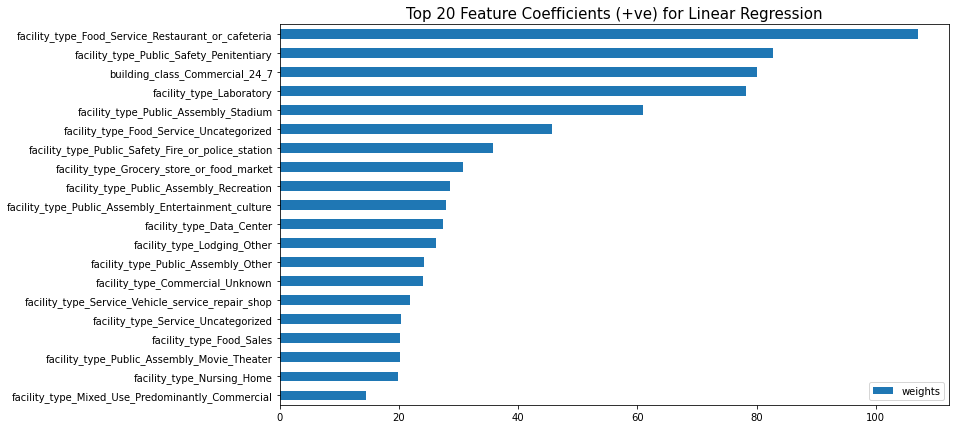

In [428]:
# Plotting top 20 +ve features in bar chart
imp_lr['weights'].head(20).plot(kind='barh', figsize=(12,7))
plt.title('Top 20 Feature Coefficients (+ve) for Linear Regression', fontsize=15)
plt.gca().invert_yaxis()
plt.legend(loc=4);

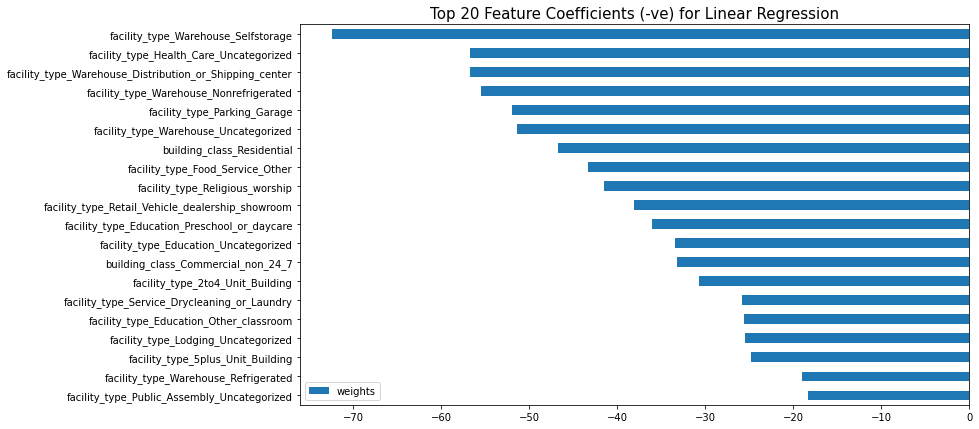

In [427]:
# Plotting top 20 -ve features in bar chart
imp_lr['weights'].tail(20).plot(kind='barh', figsize=(12,7))
plt.title('Top 20 Feature Coefficients (-ve) for Linear Regression', fontsize=15)
plt.legend(loc=3);

The plots above display the most important features for predicting the builing's EUI.

The top predictors for this model that contributes to the increase (+VE coeffcients) or decrease (-VE coefficients) in the building's EUI are mostly related to facility type.

* **For +VE coefficients the top 3 are 'facility_type_Food_Service_Restaurant_or_cafeteria', 'facility_type_Public_Safety_Penitentiary' and 'building_class_Commercial_24_7'**
    * Commercial builings that operate 24/7 are definitely more likely to consume more energy consumption. Restaurants, Cafeterias and Penitentiary are less likley to install energy saving equipment in their facilities, and are thus less energy efficient. 
    
    
* **For -VE coefficients, the top 3 are 'facility_type_Warehouse_storage', 'facility_type_Health_Care_Uncategorized' and 'facility_type_Warehouse_Distribution_or_Shipping_center'.**
    * These are the features that contrbibute the most the EUI decreasing
    * It makes a lot of sense as we would expect the size of such facilities to be big, as they do not use as energy-intensive equipment as other sites. These all contributes to a smaller EUI


### Ridge Regression

In [350]:
%%time 
# First, we find the optimal alpha
ridge_alphas = np.logspace(0, 5, 200)

optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=10)
optimal_ridge.fit(X_train, y_train)

print(optimal_ridge.alpha_)

5.052631065335681
CPU times: user 8min 26s, sys: 2min 29s, total: 10min 55s
Wall time: 4min 37s


In [351]:
# We fit the model
ridge = Ridge(alpha=optimal_ridge.alpha_)

Train Score: 0.44099491323205176
Test Score: 0.4104672183115263
Cross Validation Score 0.4363138463664895
MSE on training set: 1311.9336927145694
MSE on testing set: 1490.8641481999675


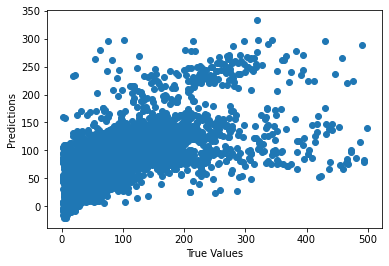

In [352]:
warnings.filterwarnings("ignore")
model_ridge = ridge.fit(X_train_scaled, y_train)
predictions = ridge.predict(X_test_scaled)

## The line/ model
plt.scatter(y_test, predictions)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_ridge.score(X_train_scaled,y_train))
print("Test Score:", model_ridge.score(X_test_scaled, y_test))
print("Cross Validation Score", np.mean(cross_val_score(ridge, X_train_scaled, y_train, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train, model_ridge.predict(X_train_scaled))}')
print(f'MSE on testing set: {mean_squared_error(y_test, predictions)}')

In [353]:
model_name.append('Ridge Regression')
model_var.append(ridge)
model_scores.append(model_ridge.score(X_train, y_train))
model_test_scores.append(model_ridge.score(X_test,y_test))
model_cv_scores.append(np.mean(cross_val_score(ridge, X_train, y_train, cv=10)))
model_mse_train_scores.append(mean_squared_error(y_train, model_ridge.predict(X_train)))
model_mse_test_scores.append(mean_squared_error(y_test, predictions))

#### Evaluating Ridge Regression Results

Let us find the factors/coefficients that had the most influence and try to make sense of it

In [392]:
imp_ridge = pd.DataFrame(model_ridge.coef_,
                        index = X.columns,
                        columns=['weights']).sort_values(by='weights',ascending=False)
imp_ridge

,weights
heating_degree_days,22.361191
july_avg_temp,9.858758
building_class_Commercial_24_7,8.532094
avg_temp,8.301801
facility_type_Grocery_store_or_food_market,6.394678
september_avg_temp,6.295171
february_avg_temp,6.194370
may_avg_temp,4.780276
facility_type_Laboratory,4.578278
facility_type_Health_Care_Inpatient,4.161407


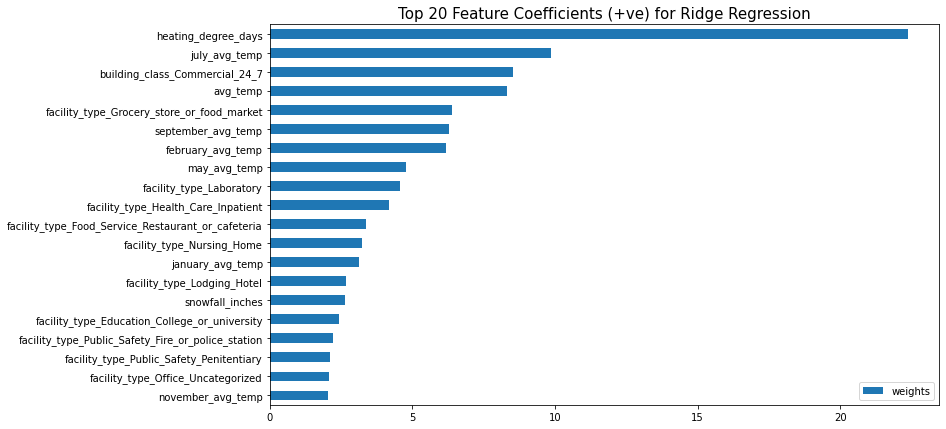

In [393]:
# Plotting top 20 +ve features in bar chart
imp_ridge['weights'].head(20).plot(kind='barh', figsize=(12,7))
plt.title('Top 20 Feature Coefficients (+ve) for Ridge Regression', fontsize=15)
plt.gca().invert_yaxis()
plt.legend(loc=4);

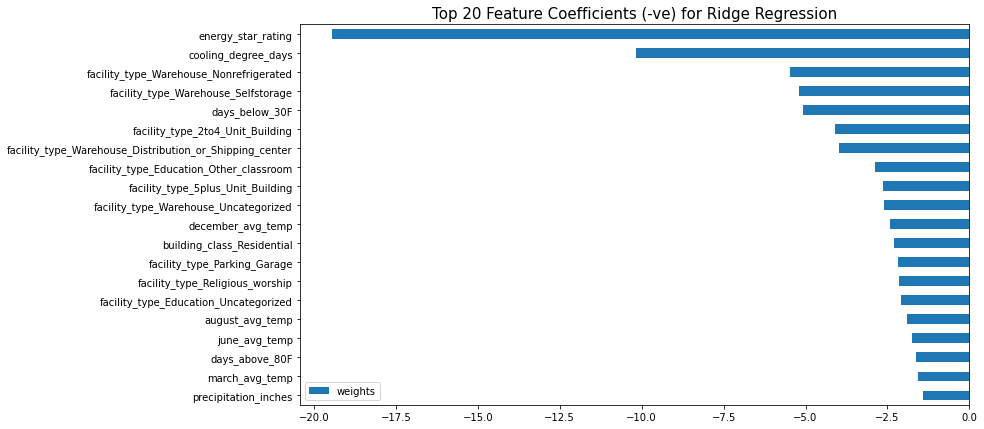

In [429]:
# Plotting top 20 -ve features in bar chart
imp_ridge['weights'].tail(20).plot(kind='barh', figsize=(12,7))
plt.title('Top 20 Feature Coefficients (-ve) for Ridge Regression', fontsize=15)
plt.legend(loc=3);

The plots above display the most important features for predicting the builing's EUI

For this model, the top predictors for this model that contributes to the increase (+VE coeffcients) or decrease (-VE coefficients) in the building's EUI are much more varied and contain other features such as monthly_avg_temp, energy_star_rating, heating_degree_days etc.


* **For +VE coefficients the top 3 are 'heating_degree_days', 'july_avg_temp' and 'building_class_Commercial_24_7'**
    * Heating degree days is a measurement designed to quantify the demand needed to heat a building. As this increases, this would entail more energy is required. Thus, the building's EUI would also be expected to increase.
    * According online source, the hottest period of the year in the United States typically occur between mid-July and mid-August. During this period, we would think that cooling appliances energy consumption is the highest here, thus, it makes sense that july_avg_temp would be one of the highest predictors
    
[source](http://https://www.climate.gov/news-features/featured-images/if-things-go-%E2%80%9Cnormal%E2%80%9D-most-us-locations-will-have-their-hottest-day#:~:text=For%20most%20of%20the%20country,to%20keep%20increasing%20into%20July)

* **For -VE coefficients, the top 3 are 'energy_star_rating', 'cooling_degree_days' and 'facility_type_Warehouse_Nonrefrigerated'.**
    * As energy_star_rating increases, this implies that the building is more energy efficient. (lower EUI)
    * For Warehouse_Nonrefrigerated, we would expect the warehouse to have large floor areas. Additionally, this is refering to Non_refrigerated, which makes it less energy intensive.
    * **For cooling_degree_days though, this is surprising as cooling_degree_days is a measurement designed to quantify the demanded needed to cool a building. Thus, as cooling_degree_days increase, we would expect the EUI to increase as well as the cooling appliances need to work harder to cool the building**.

### Lasso Regression

In [354]:
%%time
warnings.filterwarnings("ignore")
# First, we find the optimal alpha
optimal_lasso = LassoCV(n_alphas=500, cv=10)
optimal_lasso.fit(X_train_scaled, y_train)

print (optimal_lasso.alpha_)

0.020835733963110805
CPU times: user 14.3 s, sys: 832 ms, total: 15.1 s
Wall time: 9.48 s


In [96]:
# We fit the model
lasso = Lasso(alpha=optimal_lasso.alpha_)

Train Score: 0.440793015020814
Test Score: 0.4109663969619065
Cross Validation Score 0.43625292420735534
MSE on training set: 1312.4075293076369
MSE on testing set: 1489.6017798016112


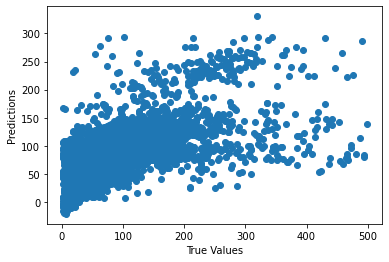

In [355]:
warnings.filterwarnings("ignore")
model_lasso = lasso.fit(X_train_scaled, y_train)
predictions = lasso.predict(X_test_scaled)

## The line/ model
plt.scatter(y_test, predictions)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_lasso.score(X_train_scaled,y_train))
print("Test Score:", model_lasso.score(X_test_scaled, y_test))
print("Cross Validation Score", np.mean(cross_val_score(lasso, X_train_scaled, y_train, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train, model_lasso.predict(X_train_scaled))}')
print(f'MSE on testing set: {mean_squared_error(y_test, predictions)}')

In [356]:
model_name.append('Lasso Regression')
model_var.append(lasso)
model_scores.append(model_lasso.score(X_train, y_train))
model_test_scores.append(model_lasso.score(X_test,y_test))
model_cv_scores.append(np.mean(cross_val_score(lasso, X_train, y_train, cv=10)))
model_mse_train_scores.append(mean_squared_error(y_train, model_lasso.predict(X_train)))
model_mse_test_scores.append(mean_squared_error(y_test, predictions))

#### Evaluating Lasso Regression Results

Let us find the factors/coefficients that had the most influence and try to make sense of it

In [395]:
imp_lasso = pd.DataFrame(model_lasso.coef_,
                        index = X.columns,
                        columns=['weights']).sort_values(by='weights',ascending=False)
imp_lasso

,weights
building_class_Commercial_24_7,14.804610
july_avg_temp,6.326757
may_avg_temp,3.862991
facility_type_Food_Service_Restaurant_or_cafeteria,3.184183
snowfall_inches,3.088663
facility_type_Nursing_Home,2.673817
facility_type_Laboratory,2.503394
year_built_average,2.363737
facility_type_Public_Safety_Penitentiary,1.989016
facility_type_Public_Safety_Fire_or_police_station,1.944297


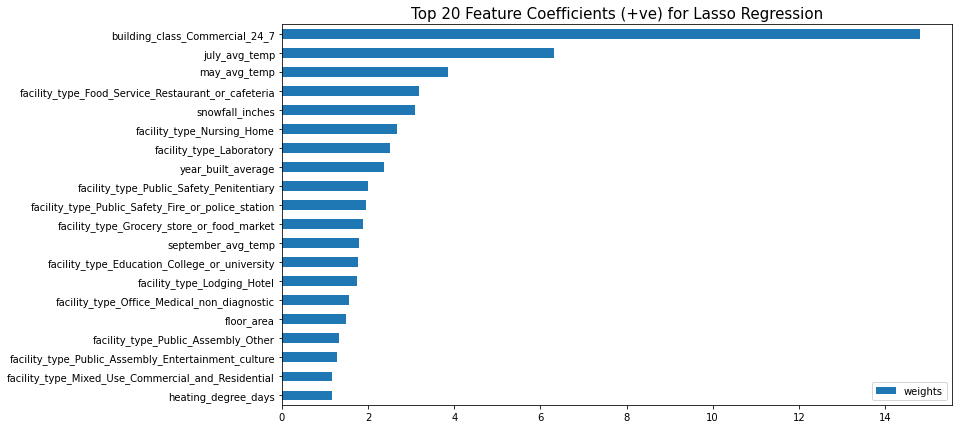

In [396]:
# Plotting top 20 +ve features in bar chart
imp_lasso['weights'].head(20).plot(kind='barh', figsize=(12,7))
plt.title('Top 20 Feature Coefficients (+ve) for Lasso Regression', fontsize=15)
plt.gca().invert_yaxis()
plt.legend(loc=4);

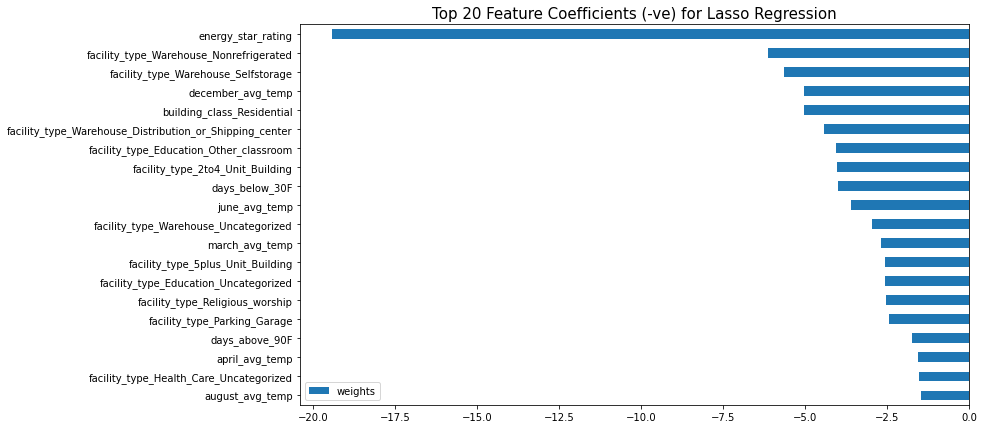

In [430]:
# Plotting top 20 -ve features in bar chart
imp_lasso['weights'].tail(20).plot(kind='barh', figsize=(12,7))
plt.title('Top 20 Feature Coefficients (-ve) for Lasso Regression', fontsize=15)
plt.legend(loc=3);

The plots above display the most important features for predicting the builing's EUI.

For this model, the top predictors for this model that contributes to the increase (+VE coeffcients) or decrease (-VE coefficients) in the building's EUI are much more varied and contain other features such as monthly_avg_temp, energy_star_rating, buidling_class etc.


* **For +VE coefficients the top 3 are 'building_class_Commercial_24_7', 'july_avg_temp' and 'may_avg_temp'**
    * As earlier discussed, buildings that operate 24/7 would use more energy, and the hottest months of the year/summer are in the middle of the year so the increased usage of cooling appliances contribututes to higher energy consumption
    * What is more interesting is that the 5th most important feature here is'snowfall_inches'. We deduce that as snowfall increases, the weather/temperature is colder and heating appliances have to work harder/use more energy
    

* **For -VE coefficients, the top 3 are 'energy_star_rating', 'facility_type_Warehouse_Nonrerigerated' and 'facility_type_Warehouse_Selfstorage'.**
    * These are similar as what we had found in the results for Linear Regression and Lasso 
    * What is more interesting is that the 4th and 5th most important feature are 'december_avg_temp' and 'building_class_Residential'
        * Though december_avg_temp may seem counter-intuitive at first, in these climates that we had identified as to where the buildings are located in, the temperature in Decemeber is not too cold yet though it is winter and the heating appliances in these buildings do not have to work as hard to keep them at a comfortable temperature. Still, it seems strange that this is one of the top predictors for -VE coefficients.
        * Residential buildings tend to consume less energy too, given the nature of activity at such places.

Linear Regression is a technique which plots a straight line within data points to minimise the error between the line and data points. The relationship between the independent and dependent variables is assumed to be linear in this case. Outliers may be a common occurence in a simple linear regression because of the straight line of best fit. When we have more than 1 predictor variable, such as this model we are trying to create, it is called Multiple Linear Regression.

Lasso deals primarily with the feature selection of valuable variables, eliminating ones that are not useful. This also takes care of multicollinearity, but in a different way. It will choose the "best" of the correlated variables and zero-out the other redundant ones. There may also be useless variables in the data which it is simply getting rid of entirely.

There is likely so much multicollinearity in the data that "vanilla" regression overfits and has bogus coefficients on predictors. Ridge is able to manage the multicollinearity and get a good out-of-sample result.



### Gradient Boosting

In [398]:
%%time

print(f'Fitting Gradient Boost')     

# Set up pipeline
gboost_pipe = Pipeline([
        ('gboost', GradientBoostingRegressor(random_state=42))
    ])

# Hyperparameters
gboost_params = {
    'gboost__n_estimators': [80, 100, 120],
    'gboost__max_depth': [1, 2, 3],
    'gboost__min_samples_split': [2, 4],
    'gboost__min_samples_leaf': [1, 2]
}

# Instantiate 5-fold GridSearchCV.
gboost = GridSearchCV(gboost_pipe, param_grid = gboost_params, cv=5)

# Fit
gboost.fit(X_train_scaled, y_train)
gboost_model = gboost.best_estimator_

# See results
print(f'The best parameters are {gboost.best_estimator_}.')

Fitting Gradient Boost
The best parameters are Pipeline(steps=[('gboost',
                 GradientBoostingRegressor(min_samples_leaf=2, n_estimators=120,
                                           random_state=42))]).
CPU times: user 34min 33s, sys: 6.62 s, total: 34min 39s
Wall time: 35min 18s


In [400]:
gboost = GradientBoostingRegressor(min_samples_leaf=2, n_estimators=120, random_state=42)
gboost.fit(X_train_scaled, y_train)

GradientBoostingRegressor(min_samples_leaf=2, n_estimators=120, random_state=42)

Train Score: 0.3171298183479049
Test Score: 0.2729230793104349
Cross Validation Score 0.3005814235992026
MSE on training set: 1602.6337152659864
MSE on testing set: 1838.6982839785605


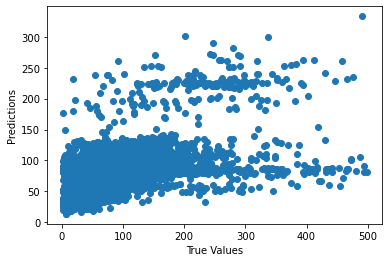

In [680]:
model_gboost = gboost.fit(X_train_scaled, y_train)
predictions = gboost.predict(X_test_scaled)

## The line/ model
plt.scatter(y_test, predictions)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_gboost.score(X_train_scaled,y_train))
print("Test Score:", model_gboost.score(X_test_scaled, y_test))
print("Cross Validation Score", np.mean(cross_val_score(gboost, X_train_scaled, y_train, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train, model_gboost.predict(X_train_scaled))}')
print(f'MSE on testing set: {mean_squared_error(y_test, predictions)}')

In [402]:
model_name.append('Gradient Boost')
model_var.append(gboost)
model_scores.append(model_gboost.score(X_train, y_train))
model_test_scores.append(model_gboost.score(X_test,y_test))
model_cv_scores.append(np.mean(cross_val_score(gboost, X_train, y_train, cv=10)))
model_mse_train_scores.append(mean_squared_error(y_train, model_gboost.predict(X_train)))
model_mse_test_scores.append(mean_squared_error(y_test, predictions))

In [421]:
imp_gboost = pd.DataFrame(model_gboost.feature_importances_,
                       index=X.columns,
                       columns=['weights']).sort_values(by='weights', ascending=False)
imp_gboost

,weights
energy_star_rating,0.415680
building_class_Commercial_24_7,0.266158
january_avg_temp,0.053803
floor_area,0.025350
facility_type_Warehouse_Nonrefrigerated,0.024646
facility_type_Warehouse_Selfstorage,0.024562
building_class_Residential,0.015389
days_below_20F,0.014943
facility_type_Nursing_Home,0.012261
facility_type_2to4_Unit_Building,0.012197


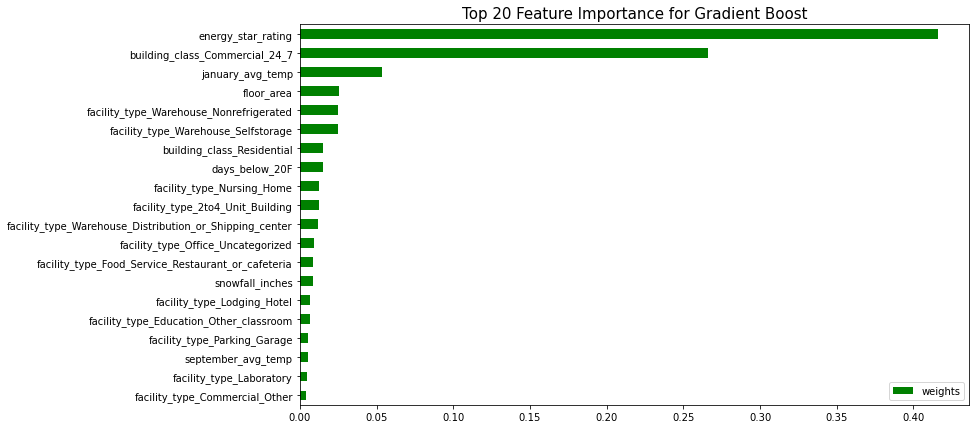

In [422]:
# Plot in bar chart
imp_gboost.head(20).plot(kind='barh', label=imp_gboost.columns[:20], figsize=(12,7), color='green')
plt.title('Top 20 Feature Importance for Gradient Boost', fontsize=15)
plt.gca().invert_yaxis()
plt.legend(loc=4);

The plots above display the most important features for predicting the builing's EUI.

* For this model, the top 3 predictors are 'energy_star_rating', 'building_class_Commercial_24_7' and 'janurary_avg_temp'
    * We had already gone through energy_star_rating and building_class_Commercial_24_7 in the previous sections. 
    * For january_avg_temp, this is where the coldest month of the year occurs, during which heating appliances have to work the hardest/consume most energy
    
* Other interesting features include days_below_20F and floor_area
    * days_below_20F is a strong indicator of how cold the weather is. (water's freezing point is 32F). 
        * floor_area is interesting because as floor_area increases, this should mean that the buildings's energy consumption should increase since it takes more energy to run the building. However, EUI is calculated by dividing the annual energy consumption by the total gross floor area of the building, so the denominator of the calculation gets larger too. How much EUI increases or decreases depends on how the increase in energy consumption scales with the increase in floor area.


### AdaBoost

In [408]:
%%time

print(f'Fitting AdaBoost')     

# Set up pipeline
ada_pipe = Pipeline([
        ('ada', AdaBoostRegressor(random_state=42))
    ])

# Hyperparameters
ada_params = {
    'ada__n_estimators': [20, 30, 40, 50],
    'ada__learning_rate': [0.8, 0.9, 1]
}

# Instantiate 5-fold GridSearchCV.
ada = GridSearchCV(ada_pipe, param_grid = ada_params, cv=5)

# Fit
ada.fit(X_train_scaled, y_train)
ada_model = ada.best_estimator_

# See results
print(f'The best parameters are {ada.best_estimator_}.')

Fitting AdaBoost
The best parameters are Pipeline(steps=[('ada',
                 AdaBoostRegressor(learning_rate=0.8, n_estimators=20,
                                   random_state=42))]).
CPU times: user 2min 21s, sys: 5.35 s, total: 2min 26s
Wall time: 2min 27s


Using these best hyperparameters, we will re-fit the model based on the data and obtain the scoring metrics

In [409]:
ada = AdaBoostRegressor(learning_rate=0.8, n_estimators=20, random_state=42)

Train Score: 0.15899649816712824
Test Score: 0.17061140158935417
Cross Validation Score 0.10724469669713674
MSE on training set: 1973.7581211018523
MSE on testing set: 2097.4333653758686


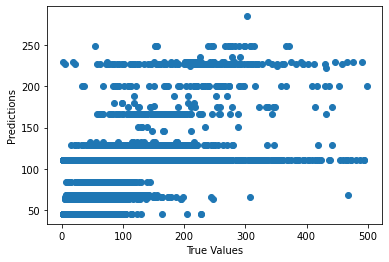

In [410]:
model_ada = ada.fit(X_train_scaled, y_train)
predictions = ada.predict(X_test_scaled)

## The line/ model
plt.scatter(y_test, predictions)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_ada.score(X_train_scaled,y_train))
print("Test Score:", model_ada.score(X_test_scaled, y_test))
print("Cross Validation Score", np.mean(cross_val_score(ada, X_train_scaled, y_train, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train, model_ada.predict(X_train_scaled))}')
print(f'MSE on testing set: {mean_squared_error(y_test, predictions)}')

In [411]:
model_name.append('Ada Boost')
model_var.append(ada)
model_scores.append(model_ada.score(X_train, y_train))
model_test_scores.append(model_ada.score(X_test,y_test))
model_cv_scores.append(np.mean(cross_val_score(ada, X_train, y_train, cv=10)))
model_mse_train_scores.append(mean_squared_error(y_train, model_ada.predict(X_train)))
model_mse_test_scores.append(mean_squared_error(y_test, predictions))

#### Evaluating Ada Boost results

In [420]:
imp_ada = pd.DataFrame(model_ada.feature_importances_,
                       index=X.columns,
                       columns=['weights']).sort_values(by='weights', ascending=False)
imp_ada

,weights
energy_star_rating,0.582317
building_class_Commercial_24_7,0.227330
building_class_Residential,0.060256
days_below_30F,0.028174
november_avg_temp,0.019259
facility_type_Industrial,0.018653
december_avg_temp,0.016987
floor_area,0.015293
facility_type_Education_College_or_university,0.011334
facility_type_Service_Vehicle_service_repair_shop,0.006683


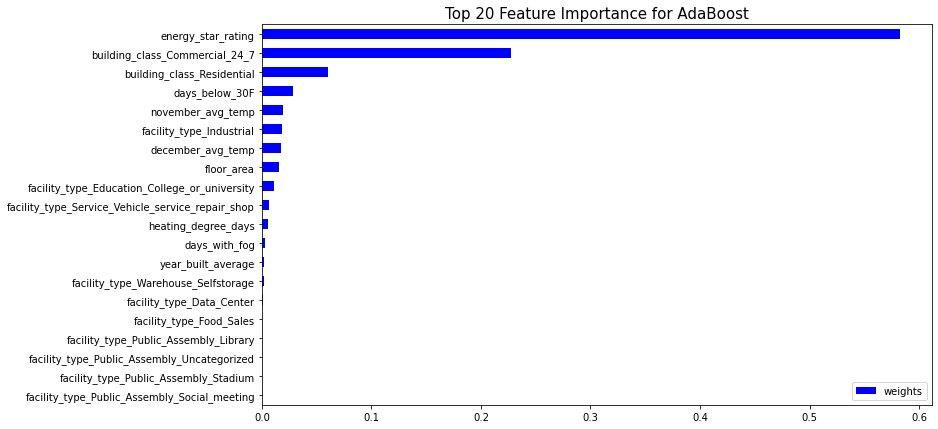

In [419]:
# Plot in bar chart
imp_ada.head(20).plot(kind='barh', label=imp_ada.columns[:20], figsize=(12,7), color='blue')
plt.title('Top 20 Feature Importance for AdaBoost', fontsize=15)
plt.gca().invert_yaxis()
plt.legend(loc=4);

The plots above display the most important features for predicting the builing's EUI.

* For this model, the top 3 predictors are 'energy_star_rating', 'building_class_Commercial_24_7' and 'building_class_Residential'
    * We had already gone through these in the previous sections. 
    
    
* There are no other notable features


### Random Forest

In [404]:
%%time

print(f'Fitting Random Forest')   

# Set up pipeline
rf_pipe = Pipeline([
        ('rf', RandomForestRegressor(random_state=42))
    ])

# Hyperparameters
rf_params = {
    'rf__n_estimators': [80, 100, 120],
    'rf__max_depth': [3, 5],
    'rf__min_samples_leaf': [2, 4],
    'rf__min_samples_split' : [2, 4]
}

# Instantiate 5-fold GridSearchCV.
gs_rf = GridSearchCV(rf_pipe, param_grid = rf_params, cv=5)

# Fit
gs_rf.fit(X_train_scaled, y_train)
gs_rf_model = gs_rf.best_estimator_

# See results
print(f'The best parameters are {gs_rf.best_estimator_}.')

Fitting Random Forest
The best parameters are Pipeline(steps=[('rf',
                 RandomForestRegressor(max_depth=5, min_samples_leaf=2,
                                       n_estimators=120, random_state=42))]).
CPU times: user 26min, sys: 5.77 s, total: 26min 5s
Wall time: 26min 37s


In [405]:
rf = RandomForestRegressor(max_depth=5, min_samples_leaf=2, n_estimators=120,
                       random_state=42)
rf.fit(X_train_scaled, y_train)

RandomForestRegressor(max_depth=5, min_samples_leaf=2, n_estimators=120,
                      random_state=42)

Train Score: 0.4040628914958153
Test Score: 0.36658201820191116
Cross Validation Score 0.39426679401506004
MSE on training set: 1398.6097620433422
MSE on testing set: 1601.845035967766


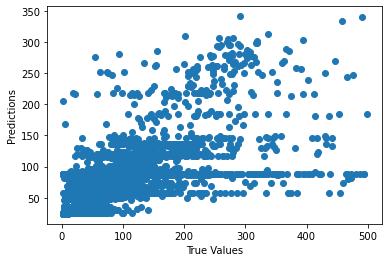

In [406]:
model_rf = rf.fit(X_train_scaled, y_train)
predictions = rf.predict(X_test_scaled)

## The line/ model
plt.scatter(y_test, predictions)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_rf.score(X_train_scaled,y_train))
print("Test Score:", model_rf.score(X_test_scaled, y_test))
print("Cross Validation Score", np.mean(cross_val_score(rf, X_train_scaled, y_train, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train, model_rf.predict(X_train_scaled))}')
print(f'MSE on testing set: {mean_squared_error(y_test, predictions)}')

In [407]:
model_name.append('Random Forest')
model_var.append(rf)
model_scores.append(model_rf.score(X_train, y_train))
model_test_scores.append(model_rf.score(X_test,y_test))
model_cv_scores.append(np.mean(cross_val_score(rf, X_train, y_train, cv=10)))
model_mse_train_scores.append(mean_squared_error(y_train, model_rf.predict(X_train)))
model_mse_test_scores.append(mean_squared_error(y_test, predictions))

#### Evaluating Random Forest Results

Let us find the factors/coefficients that had the most influence and try to make sense of it

In [415]:
imp_rf = pd.DataFrame(model_rf.feature_importances_,
                       index=X.columns,
                       columns=['weights']).sort_values(by='weights',ascending=False)
imp_rf

,weights
energy_star_rating,0.484014
building_class_Commercial_24_7,0.337358
january_avg_temp,0.043531
days_below_20F,0.027845
facility_type_Warehouse_Selfstorage,0.022093
facility_type_Office_Uncategorized,0.008399
floor_area,0.008295
facility_type_Food_Service_Restaurant_or_cafeteria,0.007545
february_avg_temp,0.007034
facility_type_Warehouse_Nonrefrigerated,0.006227


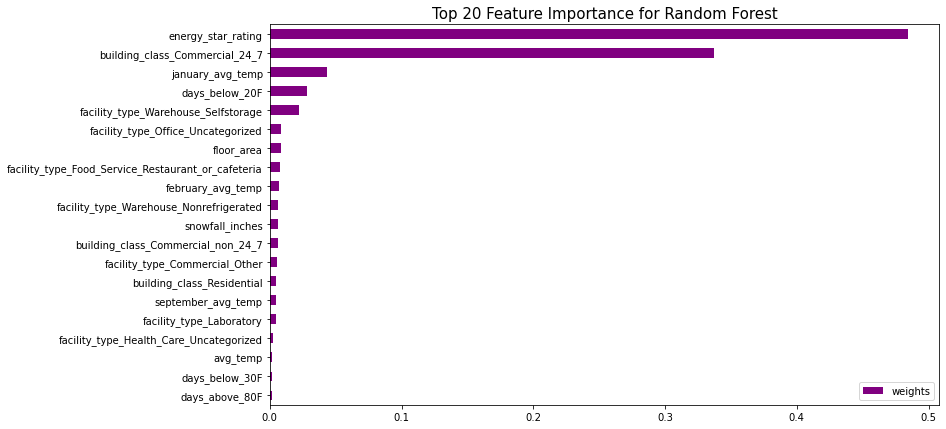

In [416]:
# Plotting Top 20 features in bar chart
imp_rf.head(20).plot(kind='barh', label=imp_rf.columns[:20], figsize=(12,7), color='purple')
plt.title('Top 20 Feature Importance for Random Forest', fontsize=15)
plt.gca().invert_yaxis()
plt.legend(loc=4);

The plots above display the most important features for predicting the builing's EUI.

* For this model, the top 3 predictors are 'energy_star_rating', 'building_class_Commercial_24_7' and 'janurary_avg_temp'
    * This is similar to what was found for Gradient Boost
    
* Other interesting features observed are the higher occurence of temperature related data as compared to other models

### Putting the Model Results together

Let us put the results of our models together and evaluate further

|s/n|Model Type|Train Score|Test Score|Cross-Validatiion Score|Train MSE|Test MSE|
|---|---|---|---|---|---|---|
|1|Linear Regression|0.441|0.412|0.436|1311.86|1487.54
|2|Ridge Regression|0.441|0.410|0.436|1311.93|1490.86
|3|Lasso Regression|0.440|0.411|0.436|1312.41|1489.60
|4|Gradient Boost|0.488|0.443|0.476|1201.89|1407.73
|5|Ada Boost|0.159|0.171|0.107|1973.76|2097.43
|6|Random Forest|0.404|0.367|0.394|1398.61|1601.84

To predict the builing's EUI, we used a few different linear regression models (linear regression, ridge regression and lasso regression), boosting ensemble models (gradient boost and ada boost) and a bagging ensemble model.

For our linear regression models, they all perform similary with identical scores across the board. 
Lieanr Regression models assume the X (input) and y (output) to have a linear relationship. 

For **simple Linear Regression**, the model is not penalized for its choice of weights. That means, if the model feels like one particular feature is particularly important, the model may place a large weight to the feature. 

**Lasso Regression** is a modification of linear regression, where the model is penalized for the sum of absolute values of the weights. Thus, the absolute values of weight will be (in general) reduced, and many will tend to be zeros.

**Ridge Regression** takes a step further and penalizes the model for the sum of squared value of the weights. Thus, the weights not only tend to have smaller absolute values, but also really tend to penalize the extremes of the weights, resulting in a group of weights that are more evenly distributed.

We postulate that the reason why all 3 give identical scores is because, from our EDA done earlier, there are only a few predictors that seem very important (such as energy_star_rating). Thus, the penalization of the weights do not have much impact on the overall model.

For boosting ensemble models, we have gradient boost and adaboost. Boosting takes a weak base learner and tries to make it a strong learner by retraining it on the misclassified samples. Gradient Boost gives us the best results across all the model, but Ada Boost also the worst performing model. Why then, are the scores so dissimilar when both of these are based of the same principles? Let us dive a little deeper into what each of this model is anbout.

**AdaBoost** is an ensemble learning method, which uses an iterative approach to learn fromn the mistakes of weak classifiers, and turn them into strong ones. Thus, the core principle of AdaBoost is to fit a sequence of weak classifiers on repeatedly modified versions of the data. After each fit, the importance weights on each observation need to be updated. As a result, AdaBoost can be used to improve the accuracy of the weak classifiers and hence makes it flexible. However, a drawback is that it is also extremely sensitive to noisy data and outliers.

**GradientBoost** is also a Boosting ensemble model and is a generalization of boosting to arbitrary, differentiable loss functions. It is a robust machine learning algorithm made up of Gradient Descent and Boosting. In the case of AdaBoost, it minimises the exponential loss function that can make the algorithm sensitive to the outliers. With Gradient Boosting, any differentiable loss function can be utilised. Gradient Boosting algorithm is more robust to outliers than AdaBoost. Another benefit is its natural handling of mixed data types (= heterogeneous features).

Thus, Gradient Boost is more flexible than Ada Boost as it is a generic algorithm that assists in seaching the approximate solutions to the additive modelling problem, and can be used for both regression and classification problems. Ada Boost, however, was mainly designed for binary classfication problems, which is why we see a vast difference in scores between them.

For bagging ensemble model, we have Random Forest. **Random Forest** consists of a large number of individual decision trees that operate as an ensemble. Each invidual trees in the random forest spits out a class prediction and the class with the most votes become our model's prediction. Random Forest performs best when there is low correlation between the models, whereby uncorrelated models can produce ensemble predictions that are more accurate than any of the individual predictions. The reason for this wonderful effect is that the trees protect each other from their individual errors. 

Random Forest does not perform as well as Gradient Boost and the Linear Regression Models. This is likely because some of our predictors have fairly high correlation with each other, sicne many of our features are temperature related.

Let us now select which model to use for fine-tuning. we will pick Gradient Boost since it is the best performing. 
Our next best performing models are the Linear Regression models. We will pick Linear Regression since it is has the lowest MSE

## <a name="sec_5"></a>Section 5: Fine-tuning our model

Let us improve our model and fine-tune some variables. Listed below are the changes that we will make, while keeping the rest of the feature engineering done.

* **Keep year_built as it originally is**
    * converting year_built into a categorical feature seemed to have very little effect
    
    
* **Include State Factor**
    * though state_factor 6 does not appear in the test set, there is still good variance seen in terms of the distribution of the EUI within each state_factor
    
    
* **Remove monthly average temperature data**
    * since we still have many other predictors related to weather, we will remove this to reduce more multicollinearity
    
    
* **drop max_wind_speed**
    * this feature originally had many Null values and when evaluating the model's results in the previous section, it does not appear in any of the top features
    
* **days_with_fog**
    * similar to max_wind_speed, this feature originally had many Null values and when evaluating the model's results in the previous section, it is not part of any of the top features

In [778]:
train_1 = df

In [779]:
train_1.shape

(75542, 63)

In [780]:
test_1 = pd.read_csv('/Users/kevinchew/Desktop/capstone_project/widsdatathon2022/test.csv')

In [781]:
test_1.shape

(9705, 63)

In [782]:
# drop id in test dataset
test_1.drop('id', inplace = True, axis = 1)

In [783]:
# drop null values in year_built
train_1 = train_1.loc[train_1['year_built'].notnull(),:]
test_1 = test_1.loc[test_1['year_built'].notnull(),:]

In [784]:
# drop year_factor
train_1.drop('Year_Factor', inplace = True, axis = 1)
test_1.drop('Year_Factor', inplace = True, axis = 1)

In [785]:
# drop all monthy temperature features
train_1.drop(['january_min_temp', 'january_avg_temp', 'january_max_temp',
       'february_min_temp', 'february_avg_temp', 'february_max_temp',
       'march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
       'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp',
       'may_max_temp', 'june_min_temp', 'june_avg_temp', 'june_max_temp',
       'july_min_temp', 'july_avg_temp', 'july_max_temp', 'august_min_temp',
       'august_avg_temp', 'august_max_temp', 'september_min_temp',
       'september_avg_temp', 'september_max_temp', 'october_min_temp',
       'october_avg_temp', 'october_max_temp', 'november_min_temp',
       'november_avg_temp', 'november_max_temp', 'december_min_temp',
       'december_avg_temp', 'december_max_temp'], inplace = True, axis = 1)

test_1.drop(['january_min_temp', 'january_avg_temp', 'january_max_temp',
       'february_min_temp', 'february_avg_temp', 'february_max_temp',
       'march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
       'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp',
       'may_max_temp', 'june_min_temp', 'june_avg_temp', 'june_max_temp',
       'july_min_temp', 'july_avg_temp', 'july_max_temp', 'august_min_temp',
       'august_avg_temp', 'august_max_temp', 'september_min_temp',
       'september_avg_temp', 'september_max_temp', 'october_min_temp',
       'october_avg_temp', 'october_max_temp', 'november_min_temp',
       'november_avg_temp', 'november_max_temp', 'december_min_temp',
       'december_avg_temp', 'december_max_temp'], inplace = True, axis = 1)

In [786]:
# drop snowdepth_inches
train_1.drop('snowdepth_inches', inplace = True, axis = 1)
test_1.drop('snowdepth_inches', inplace = True, axis = 1)

In [787]:
# drop direction_peak_wind_speed, direction_mad_wind_speed, max_wind_speed
train_1.drop('direction_peak_wind_speed', inplace = True, axis = 1)
test_1.drop('direction_peak_wind_speed', inplace = True, axis = 1)
train_1.drop('direction_max_wind_speed', inplace = True, axis = 1)
test_1.drop('direction_max_wind_speed', inplace = True, axis = 1)
train_1.drop('max_wind_speed', inplace = True, axis = 1)
test_1.drop('max_wind_speed', inplace = True, axis = 1)


In [788]:
# drop days_with_fog
train_1.drop('days_with_fog', inplace = True, axis = 1)
test_1.drop('days_with_fog', inplace = True, axis = 1)

In [789]:
# fill energy_star_rating null values with its mean
train_1['energy_star_rating'] = train_1['energy_star_rating'].fillna(train_1['energy_star_rating'].mean())
test_1['energy_star_rating'] = test_1['energy_star_rating'].fillna(test_1['energy_star_rating'].mean())

In [790]:
# create commerical_24_7 for building_class
train_1['building_class'] = train_1.apply(building_class, axis = 1)
test_1['building_class'] = train_1.apply(building_class, axis = 1)

In [791]:
# get dummies
train_1 = pd.get_dummies(train_1, columns = ['State_Factor','facility_type','building_class'], drop_first = False)
test_1 = pd.get_dummies(test_1, columns = ['State_Factor','facility_type','building_class'], drop_first = False)

In [792]:
# Set up X and y variables for our prediction model
X_1 = train_1[['floor_area', 'year_built', 'energy_star_rating', 'ELEVATION',
       'cooling_degree_days', 'heating_degree_days', 'precipitation_inches',
       'snowfall_inches', 'avg_temp', 'days_below_30F', 'days_below_20F',
       'days_below_10F', 'days_below_0F', 'days_above_80F', 'days_above_90F',
       'days_above_100F', 'days_above_110F',
       'State_Factor_State_1', 'State_Factor_State_10',
       'State_Factor_State_11', 'State_Factor_State_2', 'State_Factor_State_4',
       'State_Factor_State_6', 'State_Factor_State_8',
       'facility_type_2to4_Unit_Building', 'facility_type_5plus_Unit_Building',
       'facility_type_Commercial_Other', 'facility_type_Commercial_Unknown',
       'facility_type_Data_Center',
       'facility_type_Education_College_or_university',
       'facility_type_Education_Other_classroom',
       'facility_type_Education_Preschool_or_daycare',
       'facility_type_Education_Uncategorized', 'facility_type_Food_Sales',
       'facility_type_Food_Service_Other',
       'facility_type_Food_Service_Restaurant_or_cafeteria',
       'facility_type_Food_Service_Uncategorized',
       'facility_type_Grocery_store_or_food_market',
       'facility_type_Health_Care_Inpatient',
       'facility_type_Health_Care_Outpatient_Clinic',
       'facility_type_Health_Care_Outpatient_Uncategorized',
       'facility_type_Health_Care_Uncategorized', 'facility_type_Industrial',
       'facility_type_Laboratory',
       'facility_type_Lodging_Dormitory_or_fraternity_sorority',
       'facility_type_Lodging_Hotel', 'facility_type_Lodging_Other',
       'facility_type_Lodging_Uncategorized',
       'facility_type_Mixed_Use_Commercial_and_Residential',
       'facility_type_Mixed_Use_Predominantly_Commercial',
       'facility_type_Mixed_Use_Predominantly_Residential',
       'facility_type_Multifamily_Uncategorized', 'facility_type_Nursing_Home',
       'facility_type_Office_Bank_or_other_financial',
       'facility_type_Office_Medical_non_diagnostic',
       'facility_type_Office_Mixed_use', 'facility_type_Office_Uncategorized',
       'facility_type_Parking_Garage',
       'facility_type_Public_Assembly_Drama_theater',
       'facility_type_Public_Assembly_Entertainment_culture',
       'facility_type_Public_Assembly_Library',
       'facility_type_Public_Assembly_Movie_Theater',
       'facility_type_Public_Assembly_Other',
       'facility_type_Public_Assembly_Recreation',
       'facility_type_Public_Assembly_Social_meeting',
       'facility_type_Public_Assembly_Stadium',
       'facility_type_Public_Assembly_Uncategorized',
       'facility_type_Public_Safety_Courthouse',
       'facility_type_Public_Safety_Fire_or_police_station',
       'facility_type_Public_Safety_Penitentiary',
       'facility_type_Public_Safety_Uncategorized',
       'facility_type_Religious_worship', 'facility_type_Retail_Enclosed_mall',
       'facility_type_Retail_Strip_shopping_mall',
       'facility_type_Retail_Uncategorized',
       'facility_type_Retail_Vehicle_dealership_showroom',
       'facility_type_Service_Drycleaning_or_Laundry',
       'facility_type_Service_Uncategorized',
       'facility_type_Service_Vehicle_service_repair_shop',
       'facility_type_Warehouse_Distribution_or_Shipping_center',
       'facility_type_Warehouse_Nonrefrigerated',
       'facility_type_Warehouse_Refrigerated',
       'facility_type_Warehouse_Selfstorage',
       'facility_type_Warehouse_Uncategorized',
       'building_class_Commercial_24_7', 'building_class_Commercial_non_24_7',
       'building_class_Residential']]
y_1 = train_1['site_eui']

In [793]:
# Next we do a train test split
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1,y_1,random_state = 42, test_size = 0.2)

In [794]:
# scale the data
ss = StandardScaler()
X_train_scaled_1 = ss.fit_transform(X_train_1)
X_test_scaled_1 = ss.fit_transform(X_test_1)

#### Linear Regression

In [795]:
lr = LinearRegression()

Train Score: 0.43834273634895693
Test Score: 0.4230704141127304
Cross Validation Score 0.4340686177436611
MSE on training set: 1315.9168368110165
MSE on testing set: 1325.832169301511


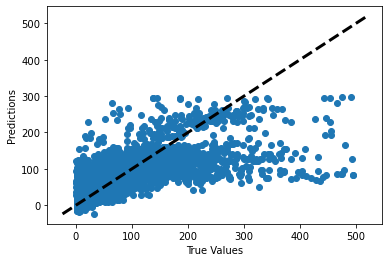

In [816]:
model_lr = lr.fit(X_train_1, y_train_1)
predictions = lr.predict(X_test_1)

## The line/ model
plt.scatter(y_test_1, predictions)
xpoints = ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=3, scalex=True, scaley=True)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_lr.score(X_train_1,y_train_1))
print("Test Score:", model_lr.score(X_test_1, y_test_1))
print("Cross Validation Score", np.mean(cross_val_score(lr, X_train_1, y_train_1, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train_1, model_lr.predict(X_train_1))}')
print(f'MSE on testing set: {mean_squared_error(y_test_1, predictions)}')

#### Gradient Boost

Train Score: 0.49736777663780063
Test Score: 0.46497414208456356
Cross Validation Score 0.48305396844229875
MSE on training set: 1177.6260154573815
MSE on testing set: 1229.5339174563164


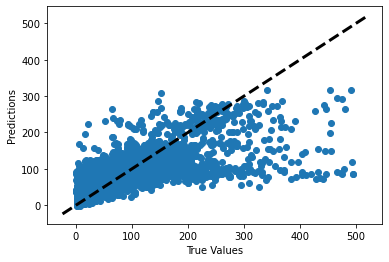

In [817]:
model_gboost_1 = gboost.fit(X_train_scaled_1, y_train_1)
predictions = gboost.predict(X_test_scaled_1)

## The line/ model
plt.scatter(y_test_1, predictions)
xpoints = ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=3, scalex=True, scaley=True)
plt.xlabel("True Values")
plt.ylabel("Predictions")

print("Train Score:", model_gboost_1.score(X_train_scaled_1,y_train_1))
print("Test Score:", model_gboost_1.score(X_test_scaled_1, y_test_1))
print("Cross Validation Score", np.mean(cross_val_score(gboost, X_train_scaled_1, y_train_1, cv=10)))
print(f'MSE on training set: {mean_squared_error(y_train_1, model_gboost_1.predict(X_train_scaled_1))}')
print(f'MSE on testing set: {mean_squared_error(y_test_1, predictions)}')

In [800]:
imp_gboost_1 = pd.DataFrame(model_gboost_1.feature_importances_,
                       index=X_1.columns,
                       columns=['weights']).sort_values(by='weights', ascending=False)
imp_gboost_1

,weights
energy_star_rating,0.428795
building_class_Commercial_24_7,0.253969
days_below_20F,0.041333
building_class_Residential,0.026034
floor_area,0.025629
facility_type_Warehouse_Nonrefrigerated,0.025415
facility_type_Warehouse_Selfstorage,0.023850
snowfall_inches,0.015459
year_built,0.014611
facility_type_Warehouse_Distribution_or_Shipping_center,0.011882


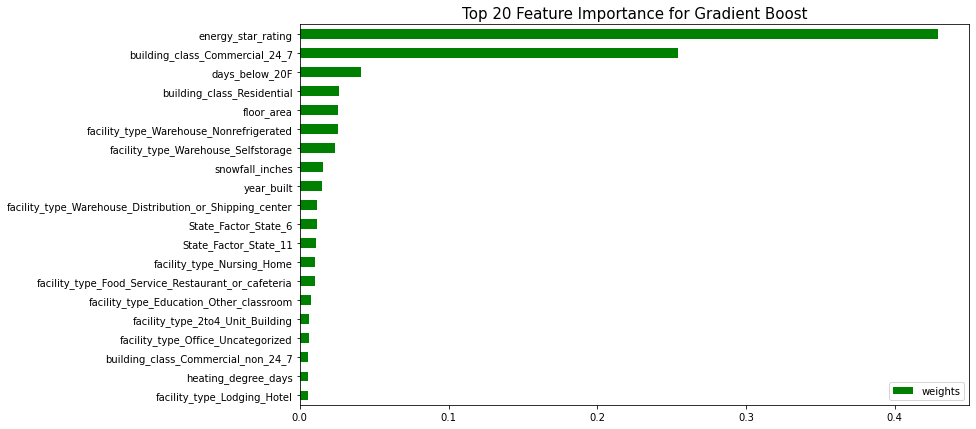

In [801]:
# Plot in bar chart
imp_gboost_1.head(20).plot(kind='barh', label=imp_gboost_1.columns[:20], figsize=(12,7), color='green')
plt.title('Top 20 Feature Importance for Gradient Boost', fontsize=15)
plt.gca().invert_yaxis()
plt.legend(loc=4);

We managed to score slightly better for Gradient Boost, but slightly worse for Linear Regression 

For Gradient Boost, for the top 20 feature importances, we see similar features compared to before, except this time there is the presence of the State Factors.

## <a name="sec_6"></a>Section 6: Conclusion & Future Recommendations

We have taken the dataset, performed EDA, did feature engineering, and ran a few models to determine which is best, and Gradient Boost is the best performing model.

Circling back to our problem statement, we want to predict a builing's EUI using its building characteristics as well as weather data for the location of the building. 

Though our scores attained are not very high, we still feel that it is a good starting point and we have learnt a couple of things that we can move forward with.

1) **Energy_Star_Rating is the strongest indicator**
    * Applying to the Singapore context, we have standards too to access whether a buidling is performing energy efficiently, which is called GreenMark Certification
    * So when building a prediction model for Singapore buildings, we can look to the GreenMark Certificaton as one of the features
    
    
2) **We can expand building_class further to add more granularity**
    * Applying to the Singapore context, BCA broadly classifies the buildings into 4 categories, which can be seen in the image attached.
    
<img src="images/classification_of_buildings_bca.png" style="height: 700px">

[*image source*](https://www.bca.gov.sg/professionals/iquas/conquas_bcat.html)


3) **Cold weather causes greater variation in the EUI/ uptick in energy consumption than warm weather**
    * Applying to the Singapore context, this might not seem useful given that we experience warm weather all year round
    * However, Singapore naturally should have a high air-conditioning usage all year long. Air-conditioning energy usage can vary largely dependent on the changs in temperature, more so when it is really hot outside. Thus, we postulate that, in Singapore, the energy consumption could vary more with slight changes in temperature.
    
    
4) **Facility type is important too**
    * Different facilities have different nature of operations, which greatly affect the energy usage that they need.
    * From a personal perspective, our company is currently collecting energy data for over 50+ companies across different industries in Singapore, which cannot be scrapped from the web unlike the weather data. Thus, it is exciting for us to begin labelling these different companies by the different industries that they are us.


### Our model's value proposition

We have learned the above lessons, and we are confident that we can apply what we learn to developing a model for one in Singapore. What is, then, the value for banks, institutions etc. as mentioned in the problem statement. Moreover, it might also seem that, we can just use the rating system, i.e., energy star rating, to make an assessment on a site's "green potential"


Our model's value is that, by predicting a building's eui, we can immediately access and estimate the amount of cost savings that we can attain by investing in eco-friendly measures.

**EUI = Annual Energy Consumption (kWh) / Gross Floor Area (ft2)**

If say, we predict a building's EUI to be 120, and we know the median or average EUI for such buidlings in similar industries is 70. We can immediately take the delta, which is 50, and multiply that builing's gross floor area. This would then give us the estimated annual energy consumption that they could save. We could then use this information to engage with them, instead of them needing to give us their energy consumption bills in the first place, which can be quite sensitive.


### Future Recommendations


* **To better measure the relationship between weather and the buildings energy performance, we should collect data on the builing's monthly energy data and daily energy usage**
    * Of course other factors would affect the energy usage such as occupancy rate, but this should still provide a good starting point
    

* **To make this dataset for robust and dynamic, we should input data for the same builings over the different years**
    * In this current dataeset, there are some builings that with only 1 data point (for either 1 of the year_factor), while others have more than 1 data point (appears in more than 1 year_factor)
    * This way, we can more accurately model the effects of the weather on the builings, since the weather would fluctuate/ differ slightly over the different years
    
    
* **Different facilities have different operating conditions and energy needs. It will be more valuable and insightful for our stakeholders if we compare and benchmark the buildings according to the type of industry that they are in.**
    * In this way, our stakeholders can make a more informed decision on whether to commision retrofitting efforts to maximize carbon emissions, issue green loans etc.


* **We can begin to expand our database and build prediction models for buildings residing in different climates.**
    * In other climates such as that of Singapore, there is little to none heating appliances since there is no cold weather experienced there. As such, the energy consumption can differ quite a bit. The features used for the model might be quite different too.
    
    
* **Include other features such as building coating materials, when the building was last upgraded with new energy saving equipment etc.**
    * From our findings, the age of the buidling does not have a distinctive relationship with the site_eui. It will be more insightful to include if and when the building was upgraded with new equipment as it paints a more accurate picture.
    * From a stakeholder perspective, it also provides more clarity if the building is still worth investing or not.
    
    
